# <center> **Thyroid Disease Data Set**

# Table of Contents

1. **[Functions](#1)**
2. **[Preprocessing](#2)**
	* [Dropping duplicates](#sub-heading1)
	* [Dealing with missing data](#sub-heading2)
	* [Type of a features](#sub-heading3)
	* [Outliers](#sub-heading4)
3. **[EDA](#3)**
	* [Target variable](#sub-heading5)
	* [Numeric features](#sub-heading6)
	* [Distributions of categorical features](#sub-heading7)
	* [Multivariate analysis](#sub-heading8)
	* [Correlation](#sub-heading9)
	* [Correlation coefficients](#sub-heading)
4. **[Transformation](#4)**
	* [Encoding](#sub-heading)
	* [Log transformation](#sub-heading)
	* [Standartisation](#sub-heading)
	* [PCA](#sub-heading)
5. **[Split](#5)**
6. **[SMOTE](#6)**
7. **[Standartisation](#7)**
8. **[Logistic Regression](#8)**
	* [Simple model](#sub-heading)
	* [Hyperparameters tuning](#sub-heading)
9. **[K-nearest neighbours](#9)**
	* [Simple model](#sub-heading)
	* [Hyperparameters tuning](#sub-heading)
10. **[General conclusion](#10)**
12. **[II variant](#12)**
  * Removing minor features & multicollinear features
	* Target encoding
	* Split
	* Transformation
	* SMOTE
	* Logistic Regression
  * K-nearest neighbours



In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
style.use('seaborn')
%matplotlib inline
#graphs in svg look clearer
%config InlineBackend.figure_format = 'svg' 
import warnings
warnings.simplefilter('ignore')

import pylab as pl

from scipy import stats
from scipy.stats import shapiro
from scipy.stats import normaltest
from scipy.stats import anderson
from scipy.stats import norm
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.diagnostic import het_breuschpagan

from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.preprocessing import OneHotEncoder, FunctionTransformer, StandardScaler,PolynomialFeatures
from sklearn.compose import ColumnTransformer

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import label_binarize

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data = pd.read_csv('/content/drive/My Drive/DA/HW5/dataset_57_hypothyroid.csv', sep=',', na_values='?')

In [ ]:
TARGET = 'Class'

# **Functions**

**Methods to find outliers**

In [ ]:
def count_iqr(data):
  Q1 = data.quantile(0.25)
  Q3 = data.quantile(0.75)
  IQR = Q3 - Q1

  out = (data <(Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))
  for col in data.columns: 
    outer = (data[col] == True).sum()
    if outer != 0:
        print(f'{col} -> outliers: -> {outer}')

In [ ]:
def Zscore_outlier(df, feature_name):
    out= 0
    m = np.mean(df)
    sd = np.std(df)
    for i in df: 
        z = (i-m)/sd
        if np.abs(z) > 3: 
            out += 1
    print(f"{feature_name}:\nOutliers amount: {out}\n")

**Plotting histograms & transformations**

In [ ]:
def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [ ]:
def draw_lognorm(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist)
    plt.title("Distribution BEFORE Log transformation")
    plt.xlabel("values")
    mean=data.mean()
    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()
    sns.despine()
    plt.show()

    f,ax_hist = plt.subplots(1)
    sns.distplot(np.log1p(data), hist=True,  kde=True, rug=True, fit=norm,  ax=ax_hist)
    plt.title("Distribution AFTER Log transformation")
    plt.xlabel("values")
    mean=np.log1p(data).mean()
    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()
    sns.despine()

    plt.show()

In [ ]:
from scipy.special import boxcox1p

def draw_boxcox(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist)
    plt.title("Distribution BEFORE Log transformation")
    plt.xlabel("values")
    mean=data.mean()
    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()
    sns.despine()
    plt.show()

    f,ax_hist = plt.subplots(1)
    sns.distplot(boxcox1p(data, 0.25), hist=True,  kde=True, rug=True, fit=norm,  ax=ax_hist)
    plt.title("Distribution AFTER Log transformation")
    plt.xlabel("values")
    mean=boxcox1p(data, 0.25).mean()
    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()
    sns.despine()

    plt.show()

In [ ]:
def draw_cuberoot(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist)
    plt.title("Distribution BEFORE cube root transformation")
    plt.xlabel("values")
    mean=data.mean()
    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()
    sns.despine()
    plt.show()

    f,ax_hist = plt.subplots(1)
    sns.distplot((data**(1/3)), hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist)
    plt.title("Distribution AFTER cube root transformation")
    plt.xlabel("values")
    mean=(data**(1/3)).mean()
    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()
    sns.despine()
    plt.show()

In [ ]:
def count_skewness_kurtosis(data):
    print("Skewness: %f" % data.skew())
    print("Kurtosis: %f" % data.kurt())

**Normality Tests**  
1) Shapiro-Wilk Test  
Tests whether a data sample has a Gaussian distribution.  

*Assumptions*  

Observations in each sample are independent and identically distributed (iid).  

*Interpretation*  

H0: the sample has a Gaussian distribution.  
H1: the sample does not have a Gaussian distribution.  

In [ ]:
def shapiro_normality_testing(data):
  stat, p = shapiro(data)
  print('stat=%.3f, p=%.3f' % (stat, p))
  if p > 0.05:
    print('Probably Gaussian')
  else:
    print('Probably not Gaussian')

**Plotting categor. features**

In [ ]:
def plot_cat_features(cat1:str, cat2:str):
    pl.subplot(2,2,1)
    n_poutcome = data[cat1].value_counts()
    genres = n_poutcome.index.values
    plt.stem(n_poutcome)
    plt.title(f'Frequency Distribution of {cat1}')
    plt.ylabel('Number of Occurrences', fontsize=9)
    plt.xlabel(f'{cat1}', fontsize=9)
    plt.xticks(range(len(genres)), genres, rotation=45)
    plt.show()
    #
    pl.subplot(2,2,2)
    n_default = data[cat2].value_counts()
    genres = n_default.index.values
    plt.stem(n_default)
    plt.title(f'Frequency Distribution of {cat2}')
    plt.ylabel('Number of Occurrences', fontsize=9)
    plt.xlabel(f'{cat2}', fontsize=9)
    plt.xticks(range(len(genres)), genres, rotation=45)
    plt.show()

**Feature importance**

In [ ]:
def get_feature_importance(model):
    feature_importance = abs(model.coef_[0])
    feature_importance = 100.0 * (feature_importance / feature_importance.max())
    sorted_idx = np.argsort(feature_importance)
    pos = np.arange(sorted_idx.shape[0]) + .5

    featfig = plt.figure()
    featax = featfig.add_subplot(1, 1, 1)
    featax.barh(pos, feature_importance[sorted_idx], align='center')
    featax.set_yticks(pos)
    featax.set_yticklabels(np.array(df.columns)[sorted_idx], fontsize=8)
    featax.set_xlabel('Relative Feature Importance')

    plt.tight_layout()   
    plt.show()

**Quality evaluation**


In [ ]:
!ls

%cd /content/drive/My Drive/DA/HW5/

from plot_cm import plot_confusion_matrix

dataset_57_hypothyroid.csv  plot_cm.py	 __pycache__
HW5_Ozhiganova.ipynb	    plot_roc.py
/content/drive/My Drive/DA/HW5


In [ ]:
from plot_roc import plot_roc

In [ ]:
def calc_metrics(test_label, preds):
    classes_names = ['negative', 'compensated_hypothyroid', 'primary_hypothyroid']
    num_classes = 3

    plot_confusion_matrix(cm=metrics.confusion_matrix(test_label, preds),
                          target_names=classes_names,
                          normalize=False)
    
    print("Accuracy:",
          round(metrics.accuracy_score(test_label, preds), 5),
        '\nBalanced accuracy:',
        round(metrics.balanced_accuracy_score(test_label, preds), 5), 
        '\nMulticlass f1-score:',
        '\n    micro:', round(metrics.f1_score(test_label, preds, average='micro'), 5),
        '\n    macro:', round(metrics.f1_score(test_label, preds, average='macro'), 5),
        '\n    weighted:', round(metrics.f1_score(test_label, preds, average='weighted'), 5))

    print('\n\nClassification report:\n')
    print(metrics.classification_report(test_label, preds, digits=5))

**ROC AUC**

In [ ]:
def count_roc_auc(model, testData, test_label, num_classes, classes_names):
    preds_prob = model.predict_proba(testData)


    print('ROC AUC:',
         '\n    macro:', round(metrics.roc_auc_score(test_label, preds_prob, multi_class='ovr', average='macro'), 5),
         '\n    weighted:', round(metrics.roc_auc_score(test_label, preds_prob, multi_class='ovr', average='weighted'), 5))

    test_label_bin = label_binarize(test_label, classes=np.arange(num_classes))

    plot_roc(test_label_bin, preds_prob, target_names=classes_names)

# **Preprocessing**

Looking at data

In [ ]:
data.head().T

,0,1,2,3,4
age,41,23,46,70,70
sex,F,F,M,F,F
on_thyroxine,f,f,f,t,f
query_on_thyroxine,f,f,f,f,f
on_antithyroid_medication,f,f,f,f,f
sick,f,f,f,f,f
pregnant,f,f,f,f,f
thyroid_surgery,f,f,f,f,f
I131_treatment,f,f,f,f,f
query_hypothyroid,f,f,f,f,f


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3772 entries, 0 to 3771
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   age                        3771 non-null   float64
 1   sex                        3622 non-null   object 
 2   on_thyroxine               3772 non-null   object 
 3   query_on_thyroxine         3772 non-null   object 
 4   on_antithyroid_medication  3772 non-null   object 
 5   sick                       3772 non-null   object 
 6   pregnant                   3772 non-null   object 
 7   thyroid_surgery            3772 non-null   object 
 8   I131_treatment             3772 non-null   object 
 9   query_hypothyroid          3772 non-null   object 
 10  query_hyperthyroid         3772 non-null   object 
 11  lithium                    3772 non-null   object 
 12  goitre                     3772 non-null   object 
 13  tumor                      3772 non-null   objec

* See a lot of missing values.

### **Dropping duplicates**

Then I drop duplicates in Dataset.

In [ ]:
data.shape

(3772, 30)

In [ ]:
data.drop_duplicates(inplace=True)
data.shape

(3711, 30)

* 61 duplicates were found & deleted.

### **Dealing with missing data**

Total amount of NaNs:

In [ ]:
data.isnull().sum().sum()

5702

Each column with amount of NaNs:

In [ ]:
data.isna().sum()

age                             1
sex                           149
on_thyroxine                    0
query_on_thyroxine              0
on_antithyroid_medication       0
sick                            0
pregnant                        0
thyroid_surgery                 0
I131_treatment                  0
query_hypothyroid               0
query_hyperthyroid              0
lithium                         0
goitre                          0
tumor                           0
hypopituitary                   0
psych                           0
TSH_measured                    0
TSH                           309
T3_measured                     0
T3                            709
TT4_measured                    0
TT4                           171
T4U_measured                    0
T4U                           327
FTI_measured                    0
FTI                           325
TBG_measured                    0
TBG                          3711
referral_source                 0
Class         

* Only 8 features (from 30) have missed values.
* These features contain many missing values, especially **TBG** column --> 3711 from 3711 (all). It has to be deleted later.
* **T3** has also many missing values (709 from 3771).   

The **TBG** feature is fully missed, so it **cannot be replaced with an average and not lose accuracy**. That's why I decided to delete it.

In [ ]:
data.drop('TBG', axis=1, inplace=True)
data.head(3)

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,TBG_measured,referral_source,Class
0,41.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.30,t,2.5,t,125.0,t,1.14,t,109.0,f,SVHC,negative
1,23.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.10,t,2.0,t,102.0,f,NaN,f,NaN,f,other,negative
2,46.0,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,NaN,t,109.0,t,0.91,t,120.0,f,other,negative


**The most widely used methods to deal with missing data are:**  
1) create a new category for NaN values  
2) impute median/mode/mean(depends on data types) 
_______________________________________________
  
Of course, each method has its pros and cons, such:  
1)  
+: Simple and easy to implement for categorical variables/columns and preserves the variance.  
-: May create random data if the missing category is more.
Doesn’t give good results when missing data is a high percentage of the data.  

2)  
+: Simple and easy to implement.
-: Features having a max number of null values may bias prediction if replace with the most occurred category.
It distorts the relation of the most frequent label.

**Analyses of how to handle the missing data.**

We'll consider that when more than/equal 70% of the data is missing, we should delete the corresponding variable and pretend it never existed. This means that we will not try any trick to fill the missing data in these cases. According to this, there is a set of variables that we should delete.

**!** Firstly, I'll drop rows, where exist NaNs more than >= 20 (more than half).

In [ ]:
inds = []
counter = 0
for i in range(len(data.index)):
  if data.iloc[i].isnull().sum() >= 20:
    counter += 1
    inds.append(i)
print('Rows with NaN >= 20: ', counter)

Rows with NaN >= 20:  0


* There are no rows in which there are extremely many gaps in the data.

In [ ]:
# summarize the number of rows with missing values for each column
for i in data.columns:
    # count number of rows with missing values
    n_miss = data[i].isnull().sum()
    perc = n_miss / data.shape[0] * 100
	
    if n_miss != 0:
        print(f'Column: {i}\nAmount {n_miss}\n%{perc}\n')

Column: age
Amount 1
%0.026946914578280787

Column: sex
Amount 149
%4.015090272163837

Column: TSH
Amount 309
%8.326596604688763

Column: T3
Amount 709
%19.105362436001077

Column: TT4
Amount 171
%4.607922392886015

Column: T4U
Amount 327
%8.811641067097817

Column: FTI
Amount 325
%8.757747237941256



Features *age, sex, TSH, T3,  TT4, T4U, FTI*  have  some missing data  (from 1 to 19 %),  I'm not sure, but think, that it is not a huge percentage and I can emplace missing data by using median value.  


In [ ]:
df = data.copy(deep=True)

In [ ]:
mf_imputer = SimpleImputer(strategy='most_frequent')

df['sex'] = mf_imputer.fit_transform(df[['sex']])

**Multivariate feature imputation - Multivariate imputation by chained equations (MICE)**

A strategy for imputing missing values by modeling each feature with missing values as a function of other features in a round-robin fashion. It performns multiple regressions over random sample ofthe data, then takes the average ofthe multiple regression values and uses that value to impute the missing value.

In [ ]:
mice_imputer = IterativeImputer()
cols_nan = ['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI' ]

for col in cols_nan:
  df[col] = mice_imputer.fit_transform(df[[col]])

In [ ]:
df.isnull().sum().sum()

0

* MICE is more powerful than the usage of median, for example, so I decided to use it here ti fill in missing values.

# **Type of a features**

In [ ]:
NUMERICAL = df.select_dtypes(exclude=['category', 'object']).columns.tolist()

In [ ]:
CATEGORICAL = list(data.select_dtypes(include=['object']).columns)
CATEGORICAL

['sex',
 'on_thyroxine',
 'query_on_thyroxine',
 'on_antithyroid_medication',
 'sick',
 'pregnant',
 'thyroid_surgery',
 'I131_treatment',
 'query_hypothyroid',
 'query_hyperthyroid',
 'lithium',
 'goitre',
 'tumor',
 'hypopituitary',
 'psych',
 'TSH_measured',
 'T3_measured',
 'TT4_measured',
 'T4U_measured',
 'FTI_measured',
 'TBG_measured',
 'referral_source',
 'Class']

In [ ]:
n_categories = [(x, data[x].nunique()) for x in CATEGORICAL]
n_categories

[('sex', 2),
 ('on_thyroxine', 2),
 ('query_on_thyroxine', 2),
 ('on_antithyroid_medication', 2),
 ('sick', 2),
 ('pregnant', 2),
 ('thyroid_surgery', 2),
 ('I131_treatment', 2),
 ('query_hypothyroid', 2),
 ('query_hyperthyroid', 2),
 ('lithium', 2),
 ('goitre', 2),
 ('tumor', 2),
 ('hypopituitary', 2),
 ('psych', 2),
 ('TSH_measured', 2),
 ('T3_measured', 2),
 ('TT4_measured', 2),
 ('T4U_measured', 2),
 ('FTI_measured', 2),
 ('TBG_measured', 1),
 ('referral_source', 5),
 ('Class', 4)]

# **Outliers**

**IQR method**

In [ ]:
count_iqr(df)

age -> outliers: -> 6
TSH -> outliers: -> 67
T3 -> outliers: -> 49
T4U -> outliers: -> 90


**Z-SCORE method**

In [ ]:
for col in NUMERICAL:
    Zscore_outlier(df[col], col)

age:
Outliers amount: 1

TSH:
Outliers amount: 39

T3:
Outliers amount: 54

TT4:
Outliers amount: 51

T4U:
Outliers amount: 74

FTI:
Outliers amount: 75



**Conclusion**
* Analyzing the emissions, in general, there are not very many of them.
* I can delete outlier values if it is due to data entry error, data processing error or outlier observations are very small in numbers. I can also use trimming at both ends to remove outliers. 
* But deleting the observation is not a good idea when we have small dataset.

* Transforming variables can also eliminate outliers. These transformed values reduces the variation caused by extreme values.

So, later I'll use some **transformation methods.**

# **EDA**

Descriptive statistics for numerical and categorical features.

In [ ]:
df.describe(include='all')

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,TBG_measured,referral_source,Class
count,3711.000000,3711,3711,3711,3711,3711,3711,3711,3711,3711,3711,3711,3711,3711,3711,3711,3711,3711.000000,3711,3711.000000,3711,3711.000000,3711,3711.000000,3711,3711.000000,3711,3711,3711
unique,NaN,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,NaN,2,NaN,2,NaN,2,NaN,2,NaN,1,5,4
top,NaN,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,NaN,t,NaN,t,NaN,t,NaN,t,NaN,f,other,negative
freq,NaN,2573,3247,3661,3669,3564,3658,3658,3652,3477,3477,3693,3677,3615,3710,3527,3402,NaN,3002,NaN,3540,NaN,3384,NaN,3386,NaN,3711,2140,3420
mean,51.860377,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.087820,NaN,2.013504,NaN,108.328475,NaN,0.994989,NaN,110.480715,NaN,NaN,NaN
std,20.120872,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.481473,NaN,0.744307,NaN,34.774903,NaN,0.186671,NaN,31.605819,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.005000,NaN,0.050000,NaN,2.000000,NaN,0.250000,NaN,2.000000,NaN,NaN,NaN
25%,36.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.585000,NaN,1.700000,NaN,89.000000,NaN,0.890000,NaN,94.000000,NaN,NaN,NaN
50%,54.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.600000,NaN,2.013504,NaN,105.000000,NaN,0.990000,NaN,110.000000,NaN,NaN,NaN
75%,67.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.500000,NaN,2.300000,NaN,123.000000,NaN,1.070000,NaN,122.000000,NaN,NaN,NaN


**Conclusion**  

* Since we are working with distances between objects, heterogeneity in the values of features can greatly distort the results of the analysis. So, a feature that itself takes high values can be decisive when calculating distances, while features with low values may have almost no effect.

* To solve this problem, I later perform *STANDARDIZATION* of the data.

* Also, I think that it is strange for feature age - containe number 455, so we have to deal with it. 

In [ ]:
df['age'].value_counts()

59.000000     95
60.000000     90
70.000000     88
73.000000     81
55.000000     79
              ..
455.000000     1
51.860377      1
6.000000       1
5.000000       1
4.000000       1
Name: age, Length: 94, dtype: int64

* It is likely that this is a typo and the age should be 45, it is easy to fix.

I am correcting 455 to 45:

In [ ]:
i = df.index[df['age'] == 455].tolist()

df.at[i, 'age'] = 45
df['age'].value_counts()

59.000000    95
60.000000    90
70.000000    88
73.000000    81
55.000000    79
             ..
51.860377     1
6.000000      1
4.000000      1
10.000000     1
5.000000      1
Name: age, Length: 93, dtype: int64

### **Target variable**

In [ ]:
df[TARGET].value_counts()

negative                   3420
compensated_hypothyroid     194
primary_hypothyroid          95
secondary_hypothyroid         2
Name: Class, dtype: int64

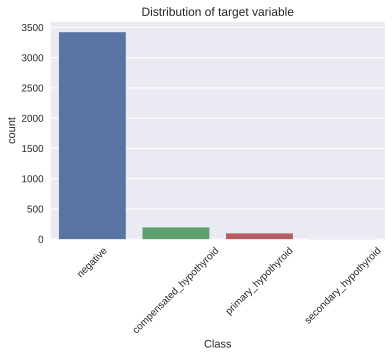

In [ ]:
sns.countplot(df[TARGET]);
plt.title('Distribution of target variable')
plt.xticks(rotation=45)
plt.show()

In [ ]:
sns.pairplot(df, hue='Class', plot_kws={'alpha':0.5})
plt.show()

Output hidden; open in https://colab.research.google.com to view.

* The target value in the dataset looks imbalanced as the number of negative samples is much higher than the other 3 classes.
* It is very bad that the ***secondary_hypothyroid*** class is represented by ***only 2 observations***, it will be *impossible to predict* it without adding data, so it needs to be *deleted*.

In [ ]:
i = df[df[TARGET] == 'secondary_hypothyroid'].index
df.drop(i, inplace=True)

**Conclusion**

* In the future, I'm going to use the *'SMOTE'* algorithm to avoid the problem of data imbalance.

* Since only two observations are presented in the "secondary_hypothyroid" class, it would be possible to try to duplicate two lines of data in the test and then, after applying "SMOTE", delete them from the train, but I am not sure that this approach is correct and that there will be no information leakage, I also can't give any guarantees, so I thought it necessary to delete this class at the moment, since there is a clear lack of data.

In [ ]:
df[TARGET].value_counts()

negative                   3420
compensated_hypothyroid     194
primary_hypothyroid          95
Name: Class, dtype: int64

### **Numeric features**

**age**

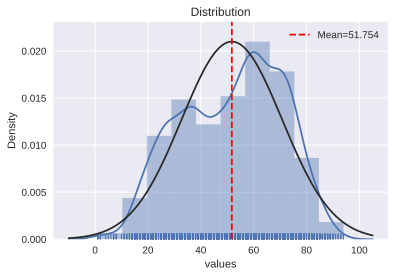

In [ ]:
draw_histogram(df['age'])

In [ ]:
count_skewness_kurtosis(df['age'])

Skewness: -0.219301
Kurtosis: -0.881686


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is strongly biased.
* *Kurtosis* shows that the distribution is not flattened and has a long tail.
* Data looks like needed to be log transformed.

**Log transformation**

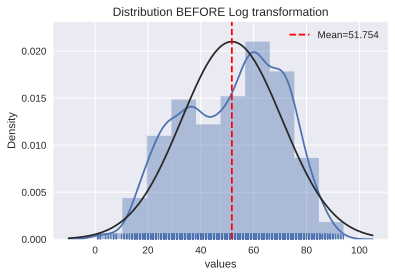

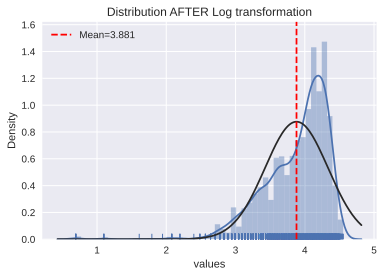

In [ ]:
draw_lognorm(df['age'])

**Testing normality**

In [ ]:
shapiro_normality_testing(df['age'])

stat=0.976, p=0.000
Probably not Gaussian


**Conclusion:**  

* I'd say it looks more like a log-normal distribution, so we can try to apply log transformation.
* After log transformation the distribution resembles a normal one, but the average values are slightly shifted to the right, while the distribution has a small tails. However, the variance has become less.

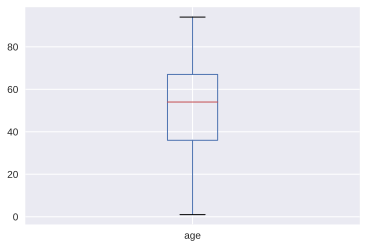

In [ ]:
df.boxplot(column=['age'])

**Conclusion** 
* This feature has a very small amount of outlaiers, near 500+.
* The median is around 52, and 4 after log transformation.

**TSH**

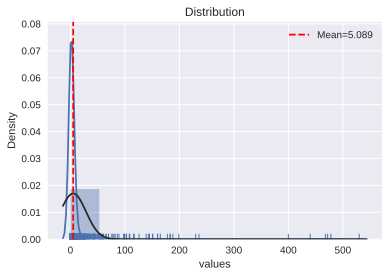

In [ ]:
draw_histogram(df['TSH'])

In [ ]:
df['TSH'].value_counts()

5.08782      309
0.20000      116
1.30000      105
1.10000       97
1.40000       91
            ... 
66.00000       1
440.00000      1
0.23000        1
236.00000      1
468.00000      1
Name: TSH, Length: 288, dtype: int64

In [ ]:
count_skewness_kurtosis(df['TSH'])

Skewness: 14.492950
Kurtosis: 259.840905


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is strongly biased.
* *Kurtosis* shows that the distribution is not flattened and has a long ringht tail.
* Data looks like needed to be log transformed.

**Log transformation**

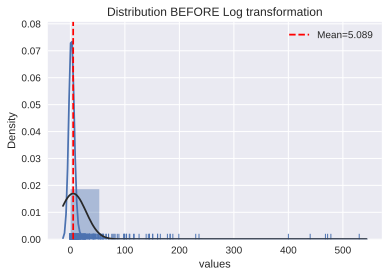

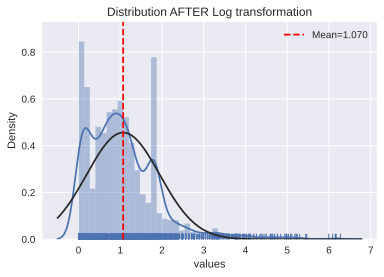

In [ ]:
draw_lognorm(df['TSH'])


**Testing normality**

In [ ]:
shapiro_normality_testing(df['TSH'])

stat=0.153, p=0.000
Probably not Gaussian


**Conclusion:**  

* I'd say it looks more like a log-normal distribution, so we can try to apply log transformation.
* After log transformation the distribution resembles a normal one, but the average values are slightly shifted to the right a little.
* However, the variance has become less, it's good.

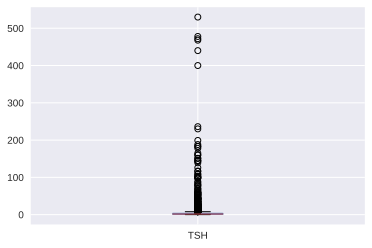

In [ ]:
df.boxplot(column=['TSH'])

**Conclusion** 
* This feature has a lot of outlaiers, from practically 0 to 500+.
* The median is around 5, and 0.6 after log transformation.

**T3**

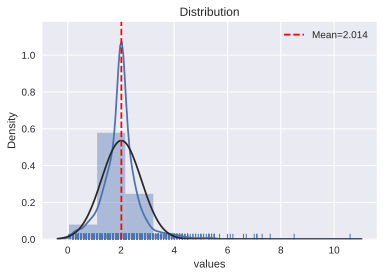

In [ ]:
draw_histogram(df['T3'])

In [ ]:
df['T3'].value_counts()

2.013504    709
2.000000    237
1.800000    207
2.200000    201
1.900000    189
           ... 
7.000000      1
8.500000      1
6.600000      1
4.900000      1
7.300000      1
Name: T3, Length: 70, dtype: int64

In [ ]:
count_skewness_kurtosis(df['T3'])

Skewness: 1.924589
Kurtosis: 12.902054


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is strongly biased.
* *Kurtosis* shows that the distribution is not flattened and has a long right tail.
* Data looks like needed to be log transformed, we observe many outliers between 4 and 10 values.

**Log transformation**

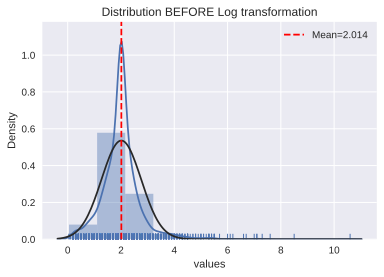

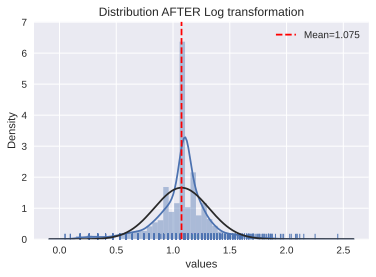

In [ ]:
draw_lognorm(df['T3'])

**Testing normality**

In [ ]:
shapiro_normality_testing(df['T3'])

stat=0.856, p=0.000
Probably not Gaussian


**Conclusion:**  

* I'd say it looks more like a log-normal distribution, so we can try to apply log transformation.
* After log transformation the distribution resembles a normal one, but the average values are slightly shifted to the right, while the distribution has a left tail.
* Moreover, the variance has become less.

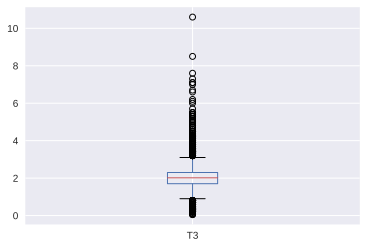

In [ ]:
df.boxplot(column=['T3'])

**Conclusion** 
* This feature has some outlaiers, from 3 to 10, and 0-1.
* The median is around 2, after log transform. it is 1+.

**TT4**

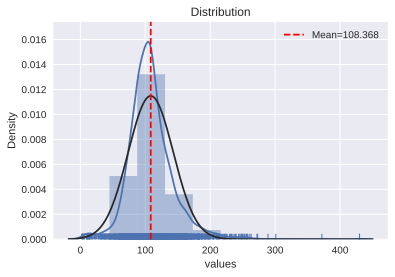

In [ ]:
draw_histogram(df['TT4'])

In [ ]:
count_skewness_kurtosis(df['TT4'])

Skewness: 1.304250
Kurtosis: 7.108845


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is strongly biased.
* *Kurtosis* shows that the distribution is not flattened and has a long tail.
* Data looks like needed to be transformed.

**Log transformation**

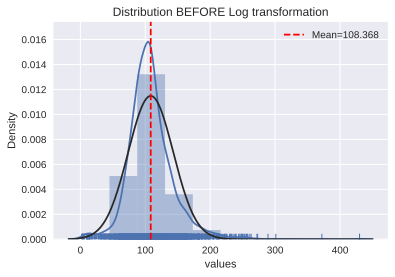

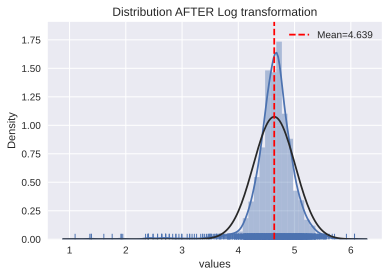

In [ ]:
draw_lognorm(df['TT4'])


**Testing normality**

In [ ]:
shapiro_normality_testing(df['TT4'])

stat=0.922, p=0.000
Probably not Gaussian


**Conclusion:**  

* I'd say it looks more like a log-normal distribution, so we can try to apply log transformation.
* After log transformation the distribution resembles a normal one, but the average values are slightly shifted to the right, while the distribution has a small tails. * * Moreover, the variance has become less.

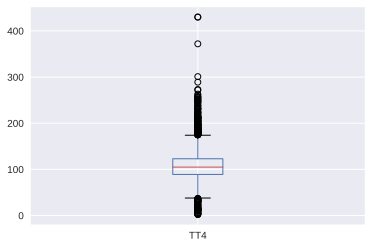

In [ ]:
df.boxplot(column=['TT4'])

**Conclusion** 
* This feature has many outlaiers, from 200 to 400+ and near 0.
* The median is around 108, after log transformaton - 4.6.

**T4U**

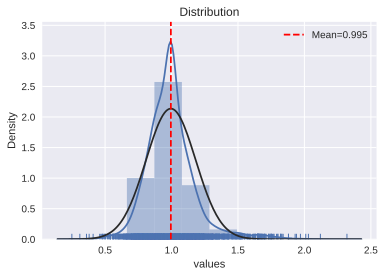

In [ ]:
draw_histogram(df['T4U'])

In [ ]:
count_skewness_kurtosis(df['T4U'])

Skewness: 1.290211
Kurtosis: 4.750950


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is biased a little !!!
* *Kurtosis* shows that the distribution is not flattened and has some tails.
* Data looks like needed to be transformed.

**Testing normality**

In [ ]:
shapiro_normality_testing(df['T4U'])

stat=0.915, p=0.000
Probably not Gaussian


**Log transformation**

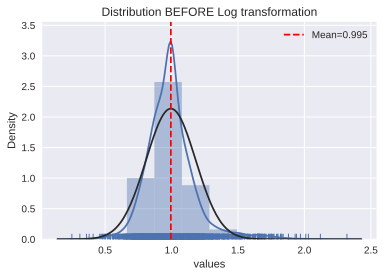

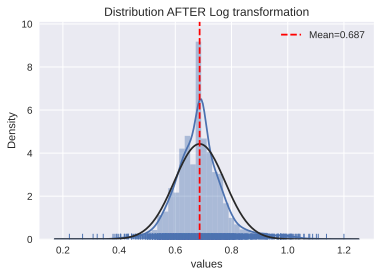

In [ ]:
draw_lognorm(df['T4U'])

**Conclusion:**  

* I'd say it looks more like a log-normal distribution, so we can try to apply log transformation.
* After log transformation the distribution resembles a normal one, but the average values are slightly shifted to the right, while the distribution has a small tails. * Moreover, the variance has become less!

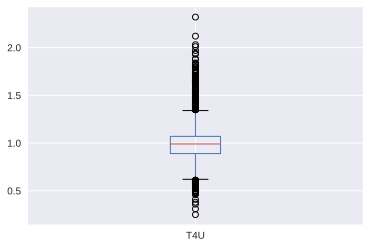

In [ ]:
df.boxplot(column=['T4U'])

**Conclusion** 
* This feature has some outlaiers, from near 0.5 and 1-2.0.
* The median is around 1, after transformation it's 0.6.

**FTI**

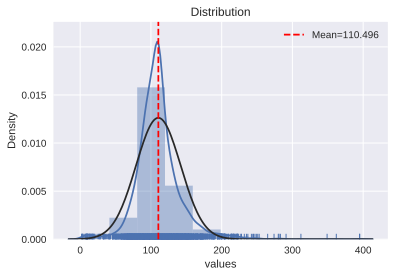

In [ ]:
draw_histogram(df['FTI'])

In [ ]:
count_skewness_kurtosis(df['FTI'])

Skewness: 1.409994
Kurtosis: 8.928941


* *Skewness* shows how symmetric the data is, from the value it is clear that the data is strongly biased.
* *Kurtosis* shows that the distribution is not flattened and has a tail.
* Data looks like needed to be log transformed.

**Testing normality**

In [ ]:
shapiro_normality_testing(df['FTI'])

stat=0.892, p=0.000
Probably not Gaussian


**Log transformation**

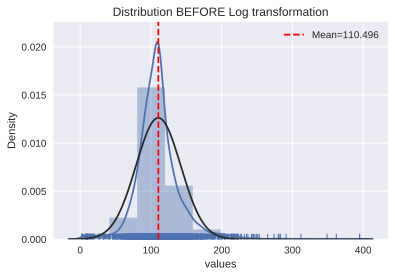

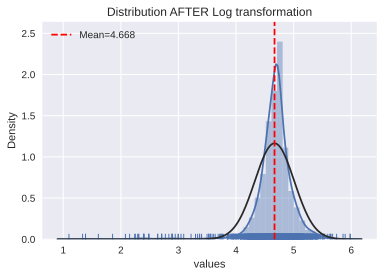

In [ ]:
draw_lognorm(df['FTI'])

**Conclusion:**  

* I'd say it looks more like a log-normal distribution, so we can try to apply log transformation.
* After log transformation the distribution resembles a normal one, but the average values are slightly shifted to the right, while the distribution has a small tails. However, the variance has become less.

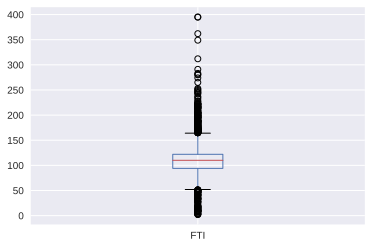

In [ ]:
df.boxplot(column=['FTI'])

**Conclusion** 
* This feature has many outlaiers, from near 0-50 and 150 to 400.
* The median is around 110, after transformation it's 5.

### **Distributions of categorical features**

**sex, on_thyroxine**

In [ ]:
df['sex'].value_counts()

F    2572
M    1137
Name: sex, dtype: int64

In [ ]:
df['on_thyroxine'].value_counts()

f    3245
t     464
Name: on_thyroxine, dtype: int64

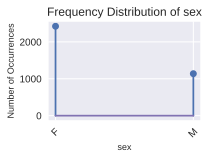

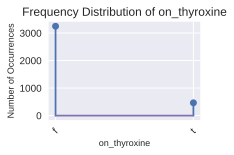

In [ ]:
plot_cat_features('sex', 'on_thyroxine')

**Conclusion**  
* The **"sex"** feature has more *female* observations.
* The **"on_thyroxine"** attribute has more *false* observations. There are almost 6 times more 'false' observations.

**'query_on_thyroxine', 'on_antithyroid_medication'**

In [ ]:
df['query_on_thyroxine'].value_counts()

f    3659
t      50
Name: query_on_thyroxine, dtype: int64

In [ ]:
df['on_antithyroid_medication'].value_counts()

f    3667
t      42
Name: on_antithyroid_medication, dtype: int64

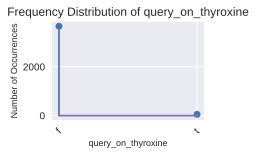

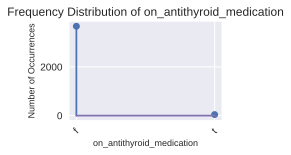

In [ ]:
plot_cat_features('query_on_thyroxine', 'on_antithyroid_medication')

**Conclusion**  
* The **"query_on_thyroxine"** feature has more *false* observations.
* The **"on_antithyroid_medication"** attribute has more *false* observations.

* There is a *sharp difference* in both features between true and false result. Both columns have many 'false' values and a very little amount of 'true' values.

**'sick', 'pregnant'**

In [ ]:
df['sick'].value_counts()

f    3562
t     147
Name: sick, dtype: int64

In [ ]:
df['pregnant'].value_counts()

f    3656
t      53
Name: pregnant, dtype: int64

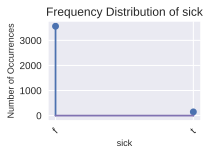

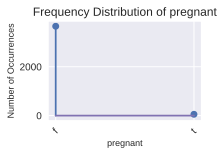

In [ ]:
plot_cat_features('sick', 'pregnant')

**Conclusion**  
* The **"sick"** feature has more *false* observations.
* The **"pregnant"** attribute has more *false* observations.

* There is a *sharp difference* in both features between true and false result. Both columns have many 'false' values and a very little amount of 'true' values.

* It is logical that the values of 'true' are much less, because pregnancy and illness are phenomena that do not prevail in most people.

**'thyroid_surgery', 'I131_treatment'**

In [ ]:
df['thyroid_surgery'].value_counts()

f    3656
t      53
Name: thyroid_surgery, dtype: int64

In [ ]:
df['I131_treatment'].value_counts()

f    3650
t      59
Name: I131_treatment, dtype: int64

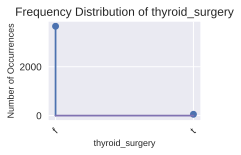

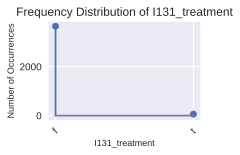

In [ ]:
plot_cat_features('thyroid_surgery', 'I131_treatment')

**Conclusion**  
* The **"thyroid_surgery"** feature has more *false* observations.
* The **"I131_treatment"** attribute has more *false* observations.

* There is a *sharp difference* in both features between true and false result. Both columns have many 'false' values and a very little amount of 'true' values.

* It is logical that the values of 'true' are much less, because these phenomena do not prevail in most people.

**'query_hypothyroid', 'query_hyperthyroid'**

In [ ]:
df['query_hypothyroid'].value_counts()

f    3476
t     233
Name: query_hypothyroid, dtype: int64

In [ ]:
df['query_hyperthyroid'].value_counts()

f    3475
t     234
Name: query_hyperthyroid, dtype: int64

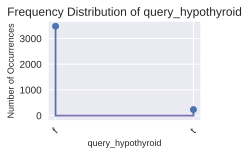

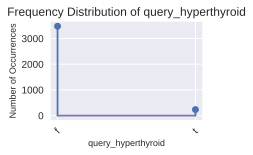

In [ ]:
plot_cat_features('query_hypothyroid', 'query_hyperthyroid')

**Conclusion**  
* The **"query_hypothyroid"** feature has more *false* observations.
* The **"query_hyperthyroid"** attribute has more *false* observations.

* There is a *sharp difference* in both features between true and false result. Both columns have many 'false' values and a very little amount of 'true' values.

* It is logical that the values of 'true' are much less, because these phenomena do not prevail in most people.

**'lithium', 'goitre'**

In [ ]:
df['lithium'].value_counts()

f    3691
t      18
Name: lithium, dtype: int64

In [ ]:
df['goitre'].value_counts()

f    3675
t      34
Name: goitre, dtype: int64

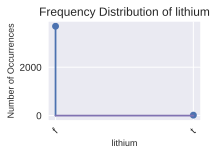

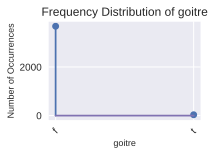

In [ ]:
plot_cat_features('lithium', 'goitre')

**Conclusion**  
* The **"lithium"** feature has more *false* observations.
* The **"goitre"** attribute has more *false* observations.

* There is a *sharp difference* in both features between true and false result. Both columns have many 'false' values and a very little amount of 'true' values.


**'tumor', 'psych'**

In [ ]:
df['tumor'].value_counts()

f    3613
t      96
Name: tumor, dtype: int64

In [ ]:
df['psych'].value_counts()

f    3525
t     184
Name: psych, dtype: int64

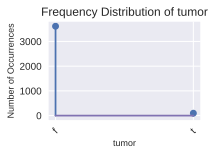

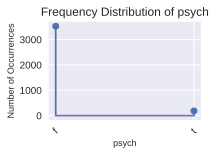

In [ ]:
plot_cat_features('tumor', 'psych')

**Conclusion**  
* The **"tumor"** feature has more *false* observations.
* The **"psych"** attribute has more *false* observations.

* There is a *sharp difference* in both features between true and false result. Both columns have many 'false' values and a very little amount of 'true' values.

* It is logical that the values of 'true' are much less, because pregnancy and these phenomena do not prevail in most people.

**'TSH_measured', 'T3_measured'**

In [ ]:
df['T3_measured'].value_counts()

t    3000
f     709
Name: T3_measured, dtype: int64

In [ ]:
df['TSH_measured'].value_counts()

t    3400
f     309
Name: TSH_measured, dtype: int64

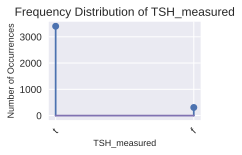

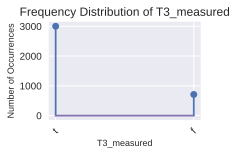

In [ ]:
plot_cat_features('TSH_measured', 'T3_measured')

**Conclusion**  
* The **"TSH_measured"** feature has more *false* observations.
* The **"T3_measured"** attribute has more *false* observations.

* There is a *sharp difference* in both features between true and false result. Both columns have many 'false' values and a very little amount of 'true' values.

**'TT4_measured', 'T4U_measured'**

In [ ]:
df['TT4_measured'].value_counts()

t    3538
f     171
Name: TT4_measured, dtype: int64

In [ ]:
df['T4U_measured'].value_counts()

t    3383
f     326
Name: T4U_measured, dtype: int64

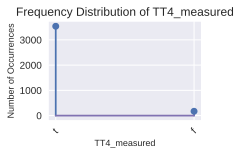

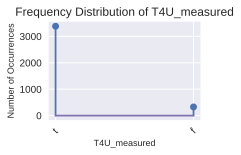

In [ ]:
plot_cat_features('TT4_measured', 'T4U_measured')

**Conclusion**  
* The **"sick"** feature has more *false* observations.
* The **"pregnant"** attribute has more *false* observations.

* There is a *sharp difference* in both features between true and false result. Both columns have many 'false' values and a very little amount of 'true' values.

**'FTI_measured', 'referral_source'**

In [ ]:
df['FTI_measured'].value_counts()

t    3385
f     324
Name: FTI_measured, dtype: int64

In [ ]:
df['referral_source'].value_counts()

other    2138
SVI      1034
SVHC      386
STMW      112
SVHD       39
Name: referral_source, dtype: int64

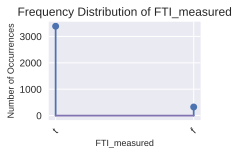

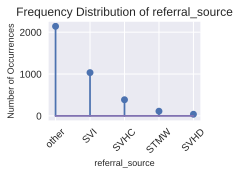

In [ ]:
plot_cat_features('FTI_measured', 'referral_source')

**Conclusion**  
* The **"FTI_measured"** feature has more *false* observations.
* The **"referral_source"** attribute has more *other* observations.

* There is a difference in 'FTI_measured' feature between true and false results. 
* In 'referral_source' column the smallest amount of  observations refers to 'SVHD', only 39.



**hypopituitary, TBG_measured**

In [ ]:
df['hypopituitary'].value_counts()

f    3708
t       1
Name: hypopituitary, dtype: int64

In [ ]:
df['TBG_measured'].value_counts()

f    3709
Name: TBG_measured, dtype: int64

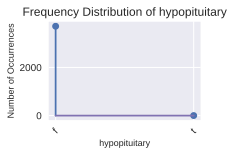

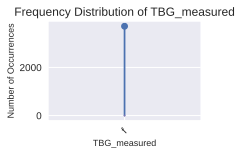

In [ ]:
plot_cat_features('hypopituitary', 'TBG_measured')

**Conclusion**  
* The **"hypopituitary"** feature has ***only one*** true observation.
* The **"TBG_measured"** attribute has ***only*** false observations.

* I think that these features do not make a special contribution to the further training of the model, so they should be **removed**.

**Conclusion**

* In this dataset there are some binary features, the gap in the values of which between 'true' and 'false 'is extremely large, for example: *3000+ -'false 'and 18 - 'true'.*
* Based on logical judgments, it will be better to remove these features from the dataset.


Features that should be removed:

| **FEATURE**      | **AMOUNT OF 'true' VALUES** | 
| :---        |    :----:   |
| 'hypopituitary' | 1       |
| 'TBG_measured'  | 0        |
| 'query_on_thyroxine' | 50       |
| 'on_antithyroid_medication'  | 42        |
| 'pregnant' | 53       |
| 'thyroid_surgery'  | 53        |
| 'I131_treatment' | 59       |
| 'lithium' | 18        |
| 'goitre' | 34        |

In [ ]:
new_df = df.copy(deep=True)

In [ ]:
df.drop(['hypopituitary', 'TBG_measured', 'query_on_thyroxine', 
         'on_antithyroid_medication', 'pregnant', 'thyroid_surgery',
         'I131_treatment', 'lithium', 'goitre'],
         axis=1, inplace=True)

In [ ]:
df.shape

(3709, 20)

### **Multivariate analysis**

**The relationship between TARGET and age**

In [ ]:
df.groupby([TARGET])['age'].mean()

Class
compensated_hypothyroid    52.293814
negative                   51.769842
primary_hypothyroid        50.094737
Name: age, dtype: float64

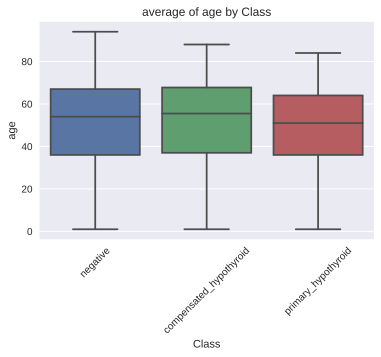

In [ ]:
ax = sns.boxplot(x=TARGET,y='age', data=df)
plt.xticks(rotation=45)
ax.set_title('average of age by Class')
plt.show()

**Conclusion**
* The average age is higher in people with 'compensated_hypothyroid' and is equal to 52 years.
* The 'negative' class has the greatest scope in years, but there are also more observations presented there.

**The relationship between TARGET and TSH**

Class
compensated_hypothyroid    13.867010
negative                    2.182394
primary_hypothyroid        91.813684
Name: TSH, dtype: float64


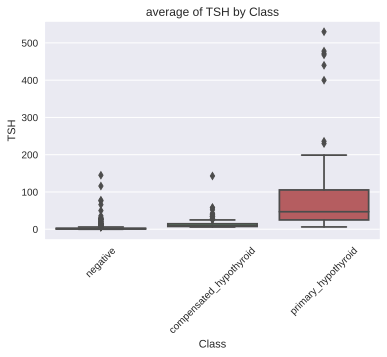

In [ ]:
print(df.groupby([TARGET])['TSH'].mean())

ax = sns.boxplot(x=TARGET,y='TSH', data=df)
plt.xticks(rotation=45)
ax.set_title('average of TSH by Class')
plt.show()

**Conclusion**
* The level of the hormone 'TSH' is the highest in the class 'primary_hypothyroid'.
* The level of the hormone 'TSH' is the lowest in the 'negative' class.
* It turns out that this is an extremely important factor for predictions of the 'primary_hypothyroid'class.

**The relationship between TARGET and FTI**

Class
compensated_hypothyroid     94.330784
negative                   113.376671
primary_hypothyroid         39.800684
Name: FTI, dtype: float64


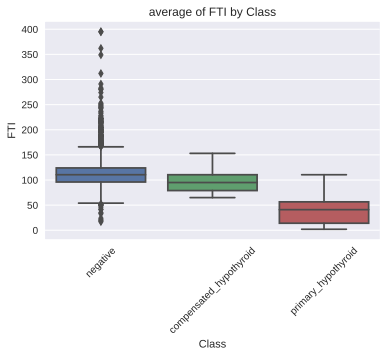

In [ ]:
print(df.groupby([TARGET])['FTI'].mean())

ax = sns.boxplot(x=TARGET,y='FTI', data=df)
plt.xticks(rotation=45)
ax.set_title('average of FTI by Class')
plt.show()

**Conclusion**
* The level of 'FTI' is the highest in the class 'negative'.
* The level of 'FTI' is the lowest in the 'primary_hypothyroid' class.
* It turns out that this is an important factor for predictions of the 'negative' class.

**The relationship between TARGET and T4U**

Class
compensated_hypothyroid    1.002757
negative                   0.993445
primary_hypothyroid        1.035841
Name: T4U, dtype: float64


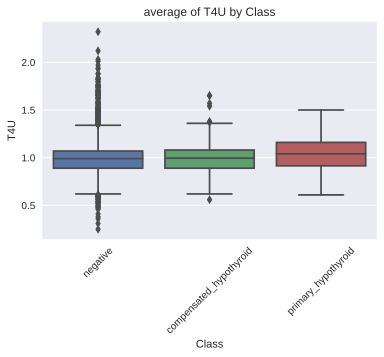

In [ ]:
print(df.groupby([TARGET])['T4U'].mean())

ax = sns.boxplot(x=TARGET,y='T4U', data=df)
plt.xticks(rotation=45)
ax.set_title('average of T4U by Class')
plt.show()


**Conclusion**
* The median level of 'T4U' in classes 'primary_hypothyroid' and  'compensated_hypothyroid' is practically equal.
* The median level of 'T4U' is the lowest in the 'negative' class.

**The relationship between TARGET and TT4**

Class
compensated_hypothyroid     92.101324
negative                   111.289920
primary_hypothyroid         36.397741
Name: TT4, dtype: float64


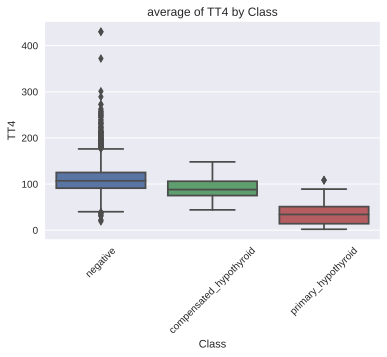

In [ ]:
print(df.groupby([TARGET])['TT4'].mean())

ax = sns.boxplot(x=TARGET,y='TT4', data=df)
plt.xticks(rotation=45)
ax.set_title('average of TT4 by Class')
plt.show()

**Conclusion**
* This feature is highly important for for predictions of the 'negative' class, because the median score is the highest here.

**The relationship between TARGET and T3**

Class
compensated_hypothyroid    1.799483
negative                   2.052103
primary_hypothyroid        1.064437
Name: T3, dtype: float64


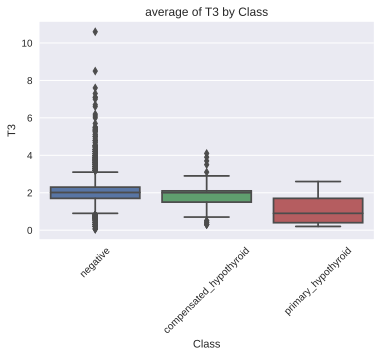

In [ ]:
print(df.groupby([TARGET])['T3'].mean())

ax = sns.boxplot(x=TARGET,y='T3', data=df)
plt.xticks(rotation=45)
ax.set_title('average of T3 by Class')
plt.show()

**Conclusion**
* Relations between  primary_hypothyroid class and T3: has the smallest median value and smallest number of features.
* "negative" class has many outliers here.

**The relationship between TARGET and sex**

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['sex'])
display(x)

sex,F,M
Class,,
compensated_hypothyroid,152,42
negative,2347,1073
primary_hypothyroid,73,22


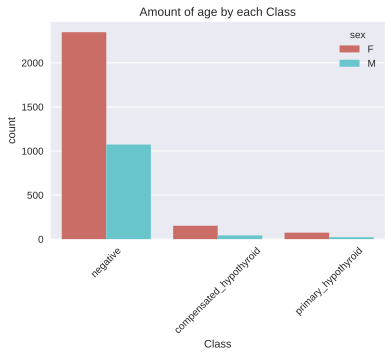

In [ ]:
sns.countplot(data=df, x=TARGET, hue="sex", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of age by each Class')
plt.show()

**Conclusion**
* There are more female representatives in all classes, most likely they are more susceptible to this disease.

**The relationship between TARGET and on_thyroxine**

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['on_thyroxine'])
display(x)

on_thyroxine,f,t
Class,,
compensated_hypothyroid,194,0
negative,2965,455
primary_hypothyroid,86,9


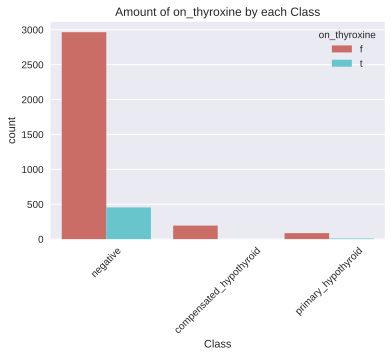

In [ ]:
sns.countplot(data=df, x=TARGET, hue="on_thyroxine", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of on_thyroxine by each Class')
plt.show()

**Conclusion**
* Most people in all classes do not have the hormone.
* The results of 'true' are clearly visible only in the negative and primary_hypothyroid classes.

**The relationship between TARGET and sick**

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['sick'])
display(x)

sick,f,t
Class,,
compensated_hypothyroid,183,11
negative,3284,136
primary_hypothyroid,95,0


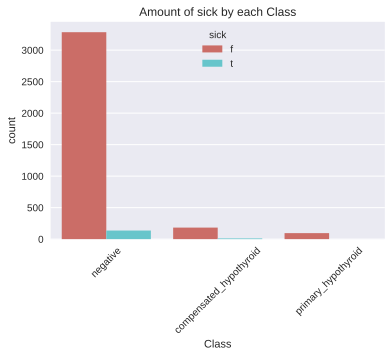

In [ ]:
sns.countplot(data=df, x=TARGET, hue="sick", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of sick by each Class')
plt.show()

**Conclusion**
* There are people who are sick in the negative class, but this class itself prevails in the data.
* Patients in the negative class are also visible.
* There are no patients in the negative class.

**The relationship between TARGET and query_hypothyroid**

query_hypothyroid,f,t
Class,,
compensated_hypothyroid,167,27
negative,3225,195
primary_hypothyroid,84,11


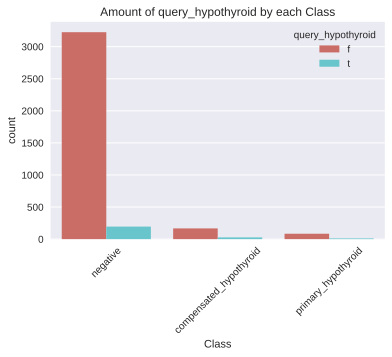

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['query_hypothyroid'])
display(x)

sns.countplot(data=df, x=TARGET, hue="query_hypothyroid", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of query_hypothyroid by each Class')
plt.show()

**Conclusion**
* There are people with query_hypothyroid in the negative class, but this class itself prevails in the data.
* People with query_hypothyroid in compensated_hypothyroid and primary_hypothyroid are practically on the same level.


**The relationship between TARGET and query_hyperthyroid**

query_hyperthyroid,f,t
Class,,
compensated_hypothyroid,182,12
negative,3201,219
primary_hypothyroid,92,3


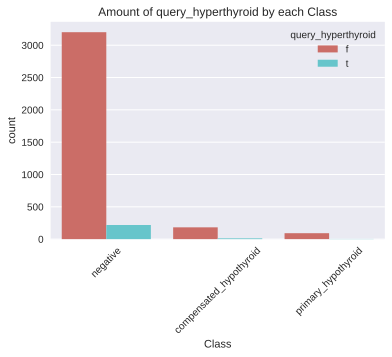

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['query_hyperthyroid'])
display(x)

sns.countplot(data=df, x=TARGET, hue="query_hyperthyroid", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of query_hyperthyroid by each Class')
plt.show()


**Conclusion**
* There are people with query_hyperthyroid in the negative class, but this class itself prevails in the data.
* People with query_hyperthyroid in compensated_hypothyroid and primary_hypothyroid are practically on the same level, very small amount.


**The relationship between TARGET and tumor**

tumor,f,t
Class,,
compensated_hypothyroid,188,6
negative,3332,88
primary_hypothyroid,93,2


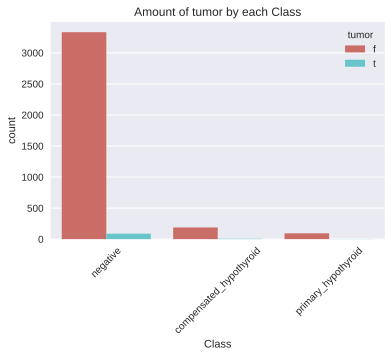

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['tumor'])
display(x)

sns.countplot(data=df, x=TARGET, hue="tumor", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of tumor by each Class')
plt.show()

**Conclusion**
* The biggest amount of people with tumor in the negative class. In other classes this feature practically abcense.



**The relationship between TARGET and psych**

psych,f,t
Class,,
compensated_hypothyroid,186,8
negative,3244,176
primary_hypothyroid,95,0


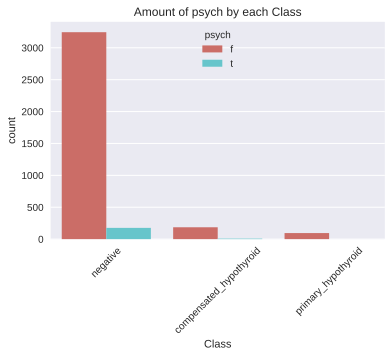

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['psych'])
display(x)

sns.countplot(data=df, x=TARGET, hue="psych", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of psych by each Class')
plt.show()

**Conclusion**
* There are people with psych in the negative class, but this class itself prevails in the data.
* People with psych in the primary_hypothyroid class is zero. 


**The relationship between TARGET and TSH_measured**

TSH_measured,f,t
Class,,
compensated_hypothyroid,0,194
negative,309,3111
primary_hypothyroid,0,95


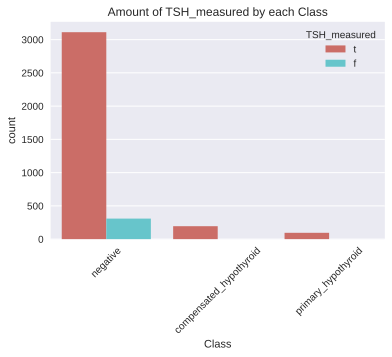

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['TSH_measured'])
display(x)

sns.countplot(data=df, x=TARGET, hue="TSH_measured", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of TSH_measured by each Class')
plt.show()

**Conclusion**
* It is a very important feature for each class, because there are a lot of true values. 


**The relationship between TARGET and T3_measured**

T3_measured,f,t
Class,,
compensated_hypothyroid,37,157
negative,663,2757
primary_hypothyroid,9,86


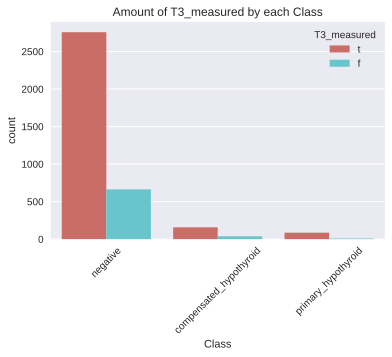

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['T3_measured'])
display(x)

sns.countplot(data=df, x=TARGET, hue="T3_measured", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of T3_measured by each Class')
plt.show()

**Conclusion**
* This measure is high in each class.

**The relationship between TARGET and TT4_measured**

TT4_measured,f,t
Class,,
compensated_hypothyroid,2,192
negative,166,3254
primary_hypothyroid,3,92


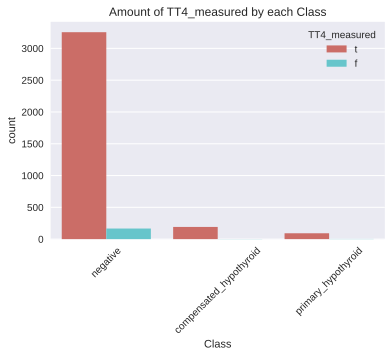

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['TT4_measured'])
display(x)

sns.countplot(data=df, x=TARGET, hue="TT4_measured", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of TT4_measured by each Class')
plt.show()

**Conclusion**
* There are a lot of people with TT4_measured in the negative class, but this class itself prevails in the data.
* More true values in each class.



**The relationship between TARGET and T4U_measured**

T4U_measured,f,t
Class,,
compensated_hypothyroid,17,177
negative,302,3118
primary_hypothyroid,7,88


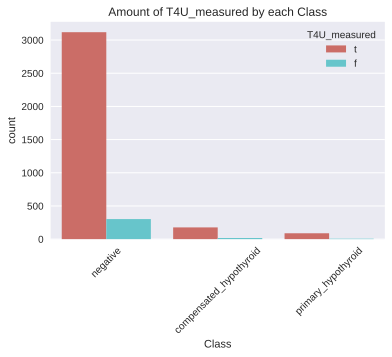

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['T4U_measured'])
display(x)

sns.countplot(data=df, x=TARGET, hue="T4U_measured", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of T4U_measured by each Class')
plt.show()

**Conclusion**
* Practically all features with different "_measures" - tere prevails true ansowers in each class.




**The relationship between TARGET and FTI_measured**

FTI_measured,f,t
Class,,
compensated_hypothyroid,17,177
negative,300,3120
primary_hypothyroid,7,88


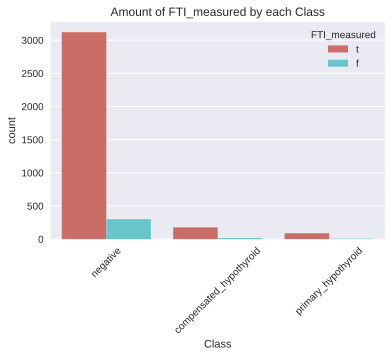

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['FTI_measured'])
display(x)

sns.countplot(data=df, x=TARGET, hue="FTI_measured", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of FTI_measured by each Class')
plt.show()

**Conclusion**
* Practically all features with different "_measures" - there prevails true ansowers in each class.


**The relationship between TARGET and referral_source**

referral_source,STMW,SVHC,SVHD,SVI,other
Class,,,,,
compensated_hypothyroid,4,10,3,58,119
negative,105,375,36,937,1967
primary_hypothyroid,3,1,0,39,52


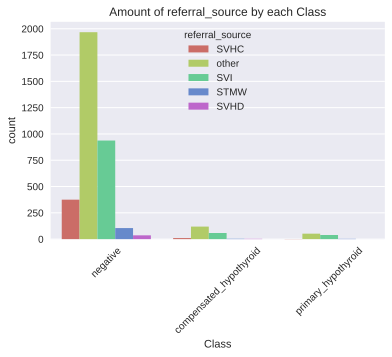

In [ ]:
x = pd.crosstab(df[TARGET], 
                df['referral_source'])
display(x)

sns.countplot(data=df, x=TARGET, hue="referral_source", palette="hls")
plt.xticks(rotation=45)
plt.title('Amount of referral_source by each Class')
plt.show()

**Conclusion**
* "Other" sources prevail in each class.
* Also, the source "SVI"is allocated in each class.

### **Correlation**

* Evaluation of the pairwise dependencies of numerical features.
* Calculation and visualization of the correlation matrix.

In [ ]:
NUMERICAL = df.select_dtypes(exclude=['category', 'object']).columns.tolist()

In [ ]:
num_data = df.loc[:,NUMERICAL]
corr_matrix = num_data.corr().round(4) 
corr_matrix

,age,TSH,T3,TT4,T4U,FTI
age,1.0000,-0.0590,-0.2290,-0.0427,-0.1720,0.0539
TSH,-0.0590,1.0000,-0.1473,-0.2618,0.0710,-0.2933
T3,-0.2290,-0.1473,1.0000,0.5098,0.4072,0.3086
TT4,-0.0427,-0.2618,0.5098,1.0000,0.4269,0.7795
T4U,-0.1720,0.0710,0.4072,0.4269,1.0000,-0.1743
FTI,0.0539,-0.2933,0.3086,0.7795,-0.1743,1.0000


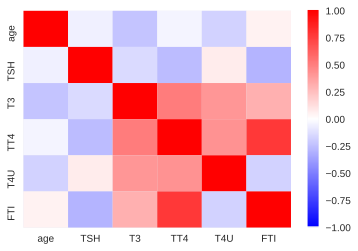

In [ ]:
sns.heatmap(corr_matrix, vmin=-1, vmax=1, cmap='bwr')

**Conclusion**:  
* It is important to understand that if the variables are strongly related to each other, then this can affect the training of the model in a bad way. The model will not adequately calculate the weights and parameters of the model. Therefore, it is better to remove such signs.

* At first glance, it is possible to distinguish a pair of red squares, the greatest dependence is observed between these features.  
1) Features **"T3"** and **"TT4"**.  
2) Features **"T3"** and **"T4U"**.  
3) Features **"T4U"** and **"TT4"**.  
4) Features **"TT4"** and **"FTI"**.  !!!!!!!  

* The correlation between these features is extremely strong, which may indicate a situation of multicollinearity.
* It can be concluded that they give almost the same information, so multicollinearity really takes place.

### **Correlation coefficients**

**'TT4' & 'FTI'**

In [ ]:
np.corrcoef(df['TT4'], df['FTI'])

array([[1.        , 0.77950127],
       [0.77950127, 1.        ]])

This correlation is 0.779, a strong positive correlation, let’s take a look at a scatter chart.

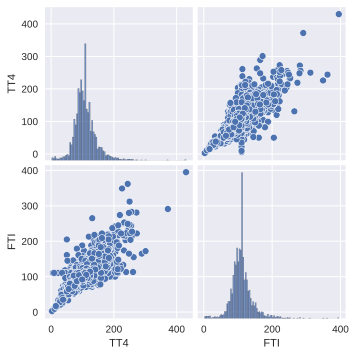

In [ ]:
sns.pairplot(df.loc[:, ['TT4', 'FTI']])
plt.show()

* We can observe the dependence between the variables.

**'T3' & 'TT4'**

In [ ]:
np.corrcoef(df['T3'], df['TT4'])

array([[1.        , 0.50978885],
       [0.50978885, 1.        ]])

This correlation is 0.5, a positive correlation, let’s take a look at a scatter chart. It's not so strong.

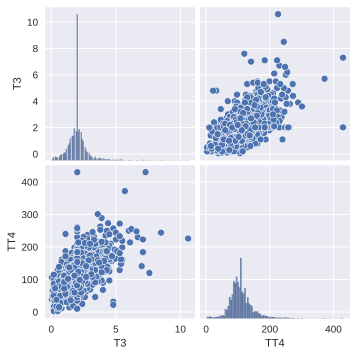

In [ ]:
sns.pairplot(df.loc[:, ['T3', 'TT4']])
plt.show()

* The dependence between the variables is not so high.

**'T3' & 'T4U'**

In [ ]:
np.corrcoef(df['T3'], df['T4U'])

array([[1.        , 0.40718505],
       [0.40718505, 1.        ]])

This correlation is 0.4, not a strong positive correlation, let’s take a look at a pair plot.

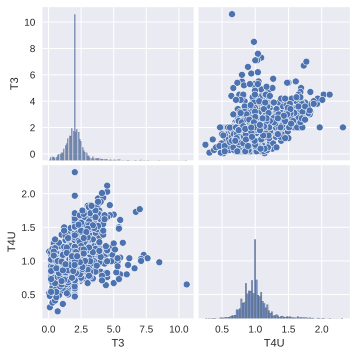

In [ ]:
sns.pairplot(df.loc[:, ['T3', 'T4U']])
plt.show()

**'T4U' & 'TT4'**

In [ ]:
np.corrcoef(df['T4U'], df['TT4'])

array([[1.        , 0.42686625],
       [0.42686625, 1.        ]])

This correlation is 0.42, not a strong positive correlation, let’s take a look at a pair plot.

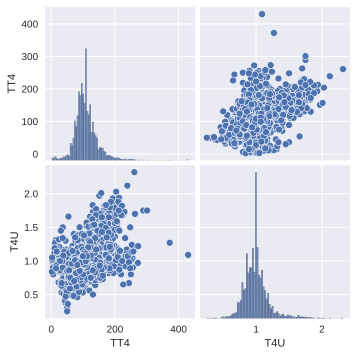

In [ ]:
sns.pairplot(df.loc[:, ['TT4', 'T4U']])
plt.show()

Dropping highly correlated variables:

In [ ]:
df.drop(['TT4', 'FTI'], axis=1, inplace=True)

**Conclusion**

* There are srting correlations between features, hence conclude the presence of multicollinearity in the data, so it's better to delete such features.

# **Transformation**

### **Encoding**


* Since there are a lot of boolean features, I use the usual *replace() function* to replace true/false with 1/0.
* Where there are more than two categories, I use OHE so that no element has more weight than the others and does not skew the model.
* We have a multi-class target, I use a Label Encoder for it.

In [ ]:
CATEGORICAL = list(df.select_dtypes(include=['object']).columns)
CATEGORICAL.remove('Class')
CATEGORICAL

['sex',
 'on_thyroxine',
 'sick',
 'query_hypothyroid',
 'query_hyperthyroid',
 'tumor',
 'psych',
 'TSH_measured',
 'T3_measured',
 'TT4_measured',
 'T4U_measured',
 'FTI_measured',
 'referral_source']

In [ ]:
n_categories = [(x, df[x].nunique()) for x in CATEGORICAL]
n_categories

[('sex', 2),
 ('on_thyroxine', 2),
 ('sick', 2),
 ('query_hypothyroid', 2),
 ('query_hyperthyroid', 2),
 ('tumor', 2),
 ('psych', 2),
 ('TSH_measured', 2),
 ('T3_measured', 2),
 ('TT4_measured', 2),
 ('T4U_measured', 2),
 ('FTI_measured', 2),
 ('referral_source', 5)]

In [ ]:
# Replacing the categorical values into binary values
df = df.replace({'f':0,'t':1, 'M':0, 'F':1})
df.head()

,age,sex,on_thyroxine,sick,query_hypothyroid,query_hyperthyroid,tumor,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,T4U_measured,T4U,FTI_measured,referral_source,Class
0,41.0,1,0,0,0,0,0,0,1,1.30,1,2.500000,1,1,1.140000,1,SVHC,negative
1,23.0,1,0,0,0,0,0,0,1,4.10,1,2.000000,1,0,0.994989,0,other,negative
2,46.0,0,0,0,0,0,0,0,1,0.98,0,2.013504,1,1,0.910000,1,other,negative
3,70.0,1,1,0,0,0,0,0,1,0.16,1,1.900000,1,0,0.994989,0,other,negative
4,70.0,1,0,0,0,0,0,0,1,0.72,1,1.200000,1,1,0.870000,1,SVI,negative


In [ ]:
one_hot_enc = OneHotEncoder(sparse=False, dtype=np.int64)

ct = ColumnTransformer([(x[0], one_hot_enc, [x[0]]) for x in n_categories if x[1] > 2], 
                       remainder='drop')

ct.fit(df)

ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                  transformer_weights=None,
                  transformers=[('referral_source',
                                 OneHotEncoder(categories='auto', drop=None,
                                               dtype=<class 'numpy.int64'>,
                                               handle_unknown='error',
                                               sparse=False),
                                 ['referral_source'])],
                  verbose=False)

In [ ]:
ct.get_feature_names()

['referral_source__x0_STMW',
 'referral_source__x0_SVHC',
 'referral_source__x0_SVHD',
 'referral_source__x0_SVI',
 'referral_source__x0_other']

In [ ]:
X = pd.DataFrame(ct.transform(df),
                 columns=[x.replace('__x0', '') for x in ct.get_feature_names()], index=df.index)
X.head(10)

,referral_source_STMW,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other
0,0,1,0,0,0
1,0,0,0,0,1
2,0,0,0,0,1
3,0,0,0,0,1
4,0,0,0,1,0
5,0,0,0,0,1
6,0,0,0,0,1
7,0,0,0,1,0
8,0,0,0,1,0
9,0,0,0,1,0


In [ ]:
df = df.join(X)

df.tail(5)

,age,sex,on_thyroxine,sick,query_hypothyroid,query_hyperthyroid,tumor,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,T4U_measured,T4U,FTI_measured,referral_source,Class,referral_source_STMW,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other
3767,30.0,1,0,0,0,0,1,0,0,5.08782,0,2.013504,0,0,0.994989,0,other,negative,0,0,0,0,1
3768,68.0,1,0,0,0,0,0,0,1,1.00000,1,2.100000,1,1,1.080000,1,SVI,negative,0,0,0,1,0
3769,74.0,1,0,0,0,1,0,0,1,5.10000,1,1.800000,1,1,1.070000,1,other,negative,0,0,0,0,1
3770,72.0,0,0,0,0,0,0,0,1,0.70000,1,2.000000,1,1,0.940000,1,SVI,negative,0,0,0,1,0
3771,64.0,1,0,0,0,0,0,0,1,1.00000,1,2.200000,1,1,1.070000,1,other,negative,0,0,0,0,1


In [ ]:
df.drop('referral_source',
           axis=1, inplace=True)

**Target encoding**

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(df[TARGET])

label_encoder.classes_

array(['compensated_hypothyroid', 'negative', 'primary_hypothyroid'],
      dtype=object)

In [ ]:
y_encoded

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
X_lab = pd.DataFrame(y_encoded,
                 columns=['Class'], index=df.index)
X_lab.head(10)

,Class
0,1
1,1
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1


In [ ]:
df.drop('Class', axis=1, inplace=True)

In [ ]:
df = df.join(X_lab)

df.head(5)

,age,sex,on_thyroxine,sick,query_hypothyroid,query_hyperthyroid,tumor,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,T4U_measured,T4U,FTI_measured,referral_source_STMW,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other,Class
0,41.0,1,0,0,0,0,0,0,1,1.30,1,2.500000,1,1,1.140000,1,0,1,0,0,0,1
1,23.0,1,0,0,0,0,0,0,1,4.10,1,2.000000,1,0,0.994989,0,0,0,0,0,1,1
2,46.0,0,0,0,0,0,0,0,1,0.98,0,2.013504,1,1,0.910000,1,0,0,0,0,1,1
3,70.0,1,1,0,0,0,0,0,1,0.16,1,1.900000,1,0,0.994989,0,0,0,0,0,1,1
4,70.0,1,0,0,0,0,0,0,1,0.72,1,1.200000,1,1,0.870000,1,0,0,0,1,0,1


### **Log transformation**

In EDA part I note that all numerical features should be log transformed.

In [ ]:
to_log_features = ['age', 'TSH',	'T3', 'T4U']
for feat in to_log_features:
  df[feat] = np.log1p(df[feat])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3709 entries, 0 to 3771
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   age                    3709 non-null   float64
 1   sex                    3709 non-null   int64  
 2   on_thyroxine           3709 non-null   int64  
 3   sick                   3709 non-null   int64  
 4   query_hypothyroid      3709 non-null   int64  
 5   query_hyperthyroid     3709 non-null   int64  
 6   tumor                  3709 non-null   int64  
 7   psych                  3709 non-null   int64  
 8   TSH_measured           3709 non-null   int64  
 9   TSH                    3709 non-null   float64
 10  T3_measured            3709 non-null   int64  
 11  T3                     3709 non-null   float64
 12  TT4_measured           3709 non-null   int64  
 13  T4U_measured           3709 non-null   int64  
 14  T4U                    3709 non-null   float64
 15  FTI_

In [ ]:
mice_imputer = IterativeImputer()
cols_nan = ['TSH', 'T3' ]

for col in cols_nan:
  df[col] = mice_imputer.fit_transform(df[[col]])

# **Split**

In [ ]:
from sklearn.model_selection import train_test_split

(trainData, 
 testData, 
 train_label, 
 test_label) = train_test_split(df.drop(TARGET,
                                            axis=1),
                                            df[TARGET],
                                            test_size=0.2,
                                            random_state=42)

print('Size of train set:', trainData.shape)
print('Size of test set:', testData.shape)

print('\nClass distribution on train:',
      train_label.value_counts(normalize=True),
      '\nClass distribution on test:', 
      test_label.value_counts(normalize=True),
      sep='\n')

Size of train set: (2967, 21)
Size of test set: (742, 21)

Class distribution on train:
1    0.924503
0    0.050219
2    0.025278
Name: Class, dtype: float64

Class distribution on test:
1    0.912399
0    0.060647
2    0.026954
Name: Class, dtype: float64


# **SMOTE**
Improve problem of imbalanced classification dataset

In [ ]:
from collections import Counter
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state = 11)
trainData, train_label = smote.fit_resample(trainData, train_label)

print('Resampled dataset shape %s' % Counter(train_label))

Resampled dataset shape Counter({1: 2743, 0: 2743, 2: 2743})


* The imbalance of classes is a fairly common problem that manifests itself in the detection of rare phenomena (as in our dataset - diseases).
* Among the sampling-based and sampling-based strategies, SMOTE comes under the generate synthetic sample strategy.
* SMOTE works by selecting pair of minority class observations and then creating a synthetic point that lies on the line connecting these two. It is pretty liberal about selecting the minority points and may end up picking up minority points that are outliers.

In [ ]:
classes_names = ['negative', 'compensated_hypothyroid', 'primary_hypothyroid']
num_classes = 3
# num_classes = train_label.nunique()
# print(num_classes)

* Make sure that the distribution of the target variable (Class) is the same in both parts.

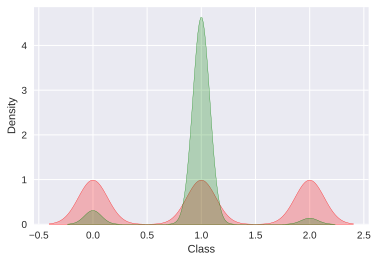

In [ ]:
fig = sns.kdeplot(train_label, shade=True, color="r")
fig = sns.kdeplot(test_label, shade=True, color="g")
plt.show()

# **Standartisation**

* Since we are working with distances between objects, heterogeneity in the values of features can greatly distort the results of the analysis. So, a feature that itself takes high values can be decisive when calculating distances, while features with low values may have almost no effect.

* To solve this problem, I later perform *STANDARDIZATION* of the data.


In [ ]:
df.describe(include='all')

,age,sex,on_thyroxine,sick,query_hypothyroid,query_hyperthyroid,tumor,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,T4U_measured,T4U,FTI_measured,referral_source_STMW,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other,Class
count,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000,3709.000000
mean,3.880580,0.693448,0.125101,0.039633,0.062820,0.063090,0.025883,0.049609,0.916689,1.070128,0.808843,1.074715,0.953896,0.912106,0.686505,0.912645,0.030197,0.104071,0.010515,0.278781,0.576436,0.973308
std,0.455209,0.461124,0.330878,0.195122,0.242672,0.243157,0.158808,0.217165,0.276389,0.874974,0.393265,0.240307,0.209739,0.283179,0.090124,0.282393,0.171152,0.305394,0.102016,0.448460,0.494190,0.277897
min,0.693147,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004988,0.000000,0.048790,0.000000,0.000000,0.223144,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.610918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.463734,1.000000,0.993252,1.000000,1.000000,0.636577,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,4.007333,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.955511,1.000000,1.103104,1.000000,1.000000,0.688135,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
75%,4.219508,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.504077,1.000000,1.193922,1.000000,1.000000,0.727549,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
max,4.553877,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,6.274762,1.000000,2.451005,1.000000,1.000000,1.199965,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000


In [ ]:
scaler = StandardScaler()

trainData = scaler.fit_transform(trainData)
testData = scaler.transform(testData)

# **Logistic Regression**

### **Simple model**

In [ ]:
lgr = LogisticRegression()
lgr.fit(trainData, train_label)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
preds = lgr.predict(testData)

At first, estimate the distribution of the target variable on the graph.

 Look at feature importance

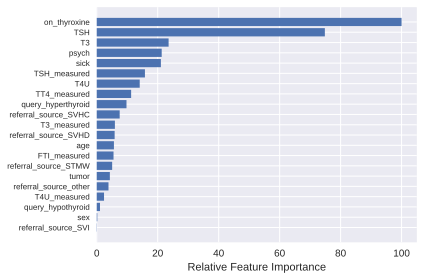

In [ ]:
get_feature_importance(lgr)

* The main contribution to the model is made by two features 'on_thyroxine', 'TSH'.

**Quality assessment**

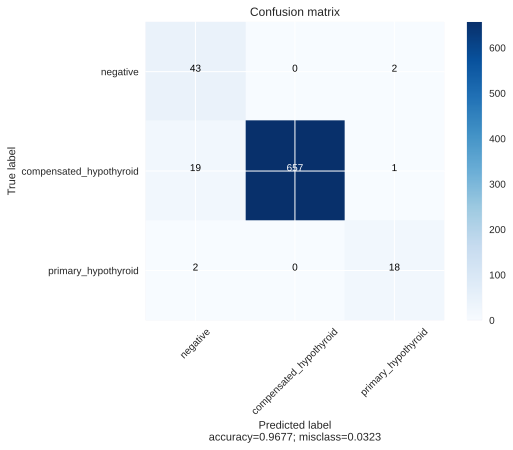

Accuracy: 0.96765 
Balanced accuracy: 0.942 
Multiclass f1-score: 
    micro: 0.96765 
    macro: 0.88402 
    weighted: 0.97024


Classification report:

              precision    recall  f1-score   support

           0    0.67188   0.95556   0.78899        45
           1    1.00000   0.97046   0.98501       677
           2    0.85714   0.90000   0.87805        20

    accuracy                        0.96765       742
   macro avg    0.84301   0.94200   0.88402       742
weighted avg    0.97625   0.96765   0.97024       742



In [ ]:
calc_metrics(test_label, preds)

**ROC AUC**

ROC AUC: 
    macro: 0.99473 
    weighted: 0.99701


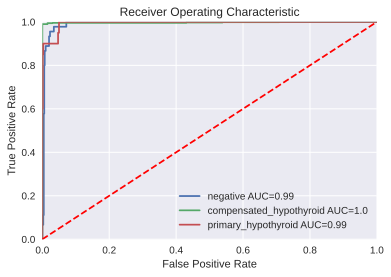

In [ ]:
count_roc_auc(lgr, testData, test_label, num_classes, classes_names)

**Conclusion**

* Simple accuracy gives an excellent result-0.97, but you should not believe this estimate 100 percent, so it's worth looking at a balanced accuracy.
* Balanced Accuracy tries to account for the imbalance in the classes and outputs a value of - 0.79, which is slightly lower, but still good.
* My classifier perfectly identifies the first class, almost one. The values of the other classes are also close to 1. This fact is also confirmed by the *f1-score* metric.
* The ROC AUC metric shows an almost perfect result of training a logistic regression model for 3 classes.

### Tuning hyperparameters 

**Selection of optimal hyperparameters for cross-validation**

In [ ]:
params = {
    'logisticregression__C': np.linspace(1e-3,1,100),
    'logisticregression__multi_class': ['ovr'],
    'logisticregression__tol':  np.linspace(1e-4,1,8),
}

In [ ]:
skf = StratifiedKFold(n_splits=5, shuffle=True,random_state=17)
lr = LogisticRegression(random_state=17, class_weight = 'balanced')
scaler = StandardScaler()

lrModel = make_pipeline(
    scaler, 
    lr
)

gd = GridSearchCV(lrModel,
                  params,
                  cv=skf, 
                  scoring='f1_macro', 
                  n_jobs=-1)

In [ ]:
gd.fit(trainData, train_label)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=17, shuffle=True),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('standardscaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('logisticregression',
                                        LogisticRegression(C=1.0,
                                                           class_weight='balanced',
                                                           dual=False,
                                                           fit_intercept=True,
                                                           intercept_scaling=1,
                                                           l1_ratio=None,
                                                           max_ite

In [ ]:
gd.best_params_

{'logisticregression__C': 0.9394545454545455,
 'logisticregression__multi_class': 'ovr',
 'logisticregression__tol': 0.7143142857142857}

**Now we will train the model with the selected parameters**

In [ ]:
lgr = LogisticRegression(random_state=17,
                         class_weight = 'balanced',
                         multi_class='ovr',
                         n_jobs=-1, 
                         C=0.9596363636363637,
                         tol=0.7143142857142857)

lgr.fit(trainData, train_label)

LogisticRegression(C=0.9596363636363637, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='ovr', n_jobs=-1, penalty='l2',
                   random_state=17, solver='lbfgs', tol=0.7143142857142857,
                   verbose=0, warm_start=False)

In [ ]:
%%time
pred = lgr.predict(testData)

CPU times: user 0 ns, sys: 780 µs, total: 780 µs
Wall time: 537 µs


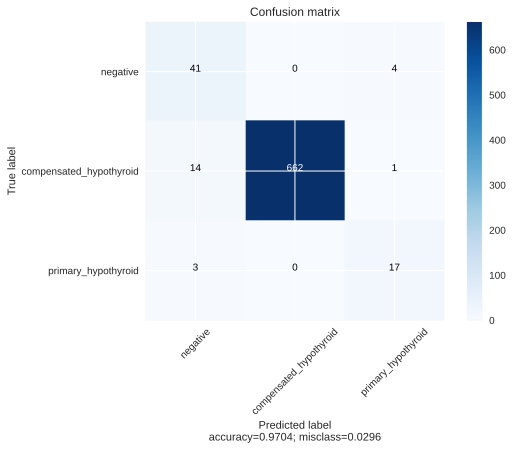

Accuracy: 0.97035 
Balanced accuracy: 0.91298 
Multiclass f1-score: 
    micro: 0.97035 
    macro: 0.86481 
    weighted: 0.97228


Classification report:

              precision    recall  f1-score   support

           0    0.70690   0.91111   0.79612        45
           1    1.00000   0.97784   0.98880       677
           2    0.77273   0.85000   0.80952        20

    accuracy                        0.97035       742
   macro avg    0.82654   0.91298   0.86481       742
weighted avg    0.97610   0.97035   0.97228       742



In [ ]:
calc_metrics(test_label, pred)

**ROC AUC**

ROC AUC: 
    macro: 0.98459 
    weighted: 0.99577


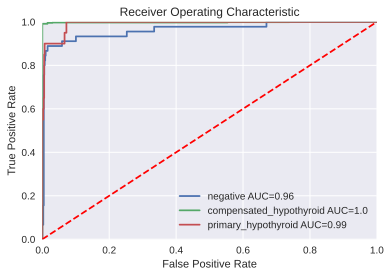

In [ ]:
count_roc_auc(lgr, testData, test_label, num_classes, classes_names)

**Conclusion**

* Simple accuracy gives an excellent result-0.97, but you should not believe this estimate 100 percent, so it's worth looking at a balanced accuracy.
* Balanced Accuracy tries to account for the imbalance in the classes and outputs a value of - 0.91, which is very good. Even higher then in a simple logistic model.
* My classifier idealy identifies the first class, almost one. The values of the other classes are also close to 1. This fact is also confirmed by the *f1-score* metric.
* The ROC AUC metric shows an almost perfect result of training a logistic regression model for 3 classes. (1.0 is the highest result) However, negative class has the lowest roc-auc score (0.96) amoung others. The highest roc-auc score has compensated_hypothyroid class(1.0)

# **K-nearest neighbours**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

### **Simple model**

In [ ]:
knrModel = KNeighborsClassifier(n_neighbors=5)  # usually left 5

knrModel.fit(trainData, train_label)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [ ]:
%%time
pred = knrModel.predict(testData)

CPU times: user 153 ms, sys: 951 µs, total: 154 ms
Wall time: 153 ms


**Quality evaluation**

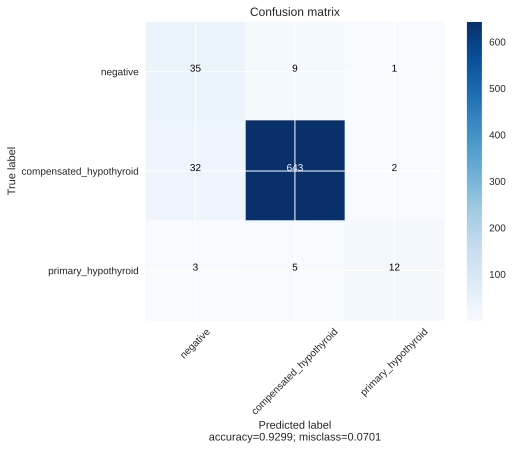

Accuracy: 0.92992 
Balanced accuracy: 0.77585 
Multiclass f1-score: 
    micro: 0.92992 
    macro: 0.75281 
    weighted: 0.93497


Classification report:

              precision    recall  f1-score   support

           0    0.50000   0.77778   0.60870        45
           1    0.97869   0.94978   0.96402       677
           2    0.80000   0.60000   0.68571        20

    accuracy                        0.92992       742
   macro avg    0.75956   0.77585   0.75281       742
weighted avg    0.94484   0.92992   0.93497       742



In [ ]:
calc_metrics(test_label, pred)

**ROC AUC**

ROC AUC: 
    macro: 0.88812 
    weighted: 0.91965


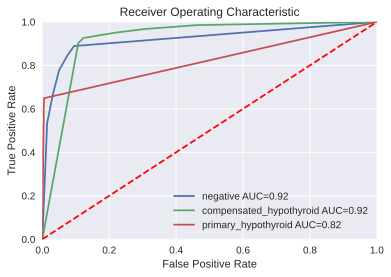

In [ ]:
count_roc_auc(knrModel, testData, test_label, num_classes, classes_names)

**Conclusion**

* Simple accuracy gives an excellent result-0.92, but you should not believe this estimate 100 percent, so it's worth looking at a balanced accuracy.
* Balanced Accuracy tries to account for the imbalance in the classes and outputs a value of - 0.77, which is very low in comparison with the logistic regression.
* My classifier  identifies the first class very good. The values of the other classes are also close to 1. This fact is also confirmed by the *f1-score* metric. (Becouse of the amount of observations there)
* Both other classes are predicted very poorly in the un-tuned KNN model.
* The ROC AUC metric shows an almost good result of training knn model for 3 classes. (0.92 is the highest result) However, cprimary_hypothyroid class has the lowest roc-auc score (0.82) amoung others.

### **Tuning hyperparameters **

**Selection of optimal hyperparameters for cross-validation**

In [ ]:
params = {
    'kneighborsclassifier__n_neighbors': [i for i in range(3, 51)], 
    'kneighborsclassifier__weights': ['uniform', 'distance'],
    'kneighborsclassifier__n_jobs': [-1,1,5],
    'kneighborsclassifier__metric': ['euclidean', 'minkowski', 'manhattan'],
    'kneighborsclassifier__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

In [ ]:
kf = KFold(n_splits=5, shuffle=True)
knn = KNeighborsClassifier()
scaler = StandardScaler()

knrModel = make_pipeline(
    scaler, 
    knn
)

gd = GridSearchCV(knrModel,
                  params,
                  cv=kf, 
                  scoring='f1_macro', 
                  n_jobs=-1)

In [ ]:
gd.fit(trainData, train_label)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('standardscaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('kneighborsclassifier',
                                        KNeighborsClassifier(algorithm='auto',
                                                             leaf_size=30,
                                                             metric='minkowski',
                                                             metric_params=None,
                                                             n_jobs=None,
                                                             n_neighbors=5, p=2,
                                                       

In [ ]:
gd.best_params_

{'kneighborsclassifier__algorithm': 'auto',
 'kneighborsclassifier__metric': 'manhattan',
 'kneighborsclassifier__n_jobs': -1,
 'kneighborsclassifier__n_neighbors': 4,
 'kneighborsclassifier__weights': 'distance'}

**Now we will train the model with the selected parameters:**

In [ ]:
knn = KNeighborsClassifier(n_neighbors=4,
                           metric='manhattan', 
                           weights='uniform', 
                           n_jobs=-1,
                           algorithm='auto')

knn.fit(trainData, train_label)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=4, p=2,
                     weights='uniform')

In [ ]:
%%time
pred = knn.predict(testData)

CPU times: user 262 ms, sys: 562 µs, total: 263 ms
Wall time: 229 ms


**Quality evaluation**

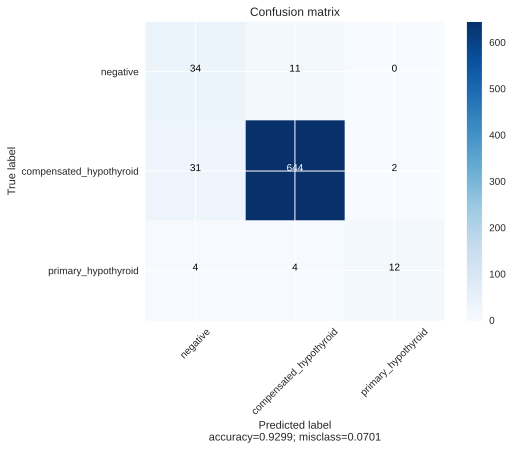

Accuracy: 0.92992 
Balanced accuracy: 0.76894 
Multiclass f1-score: 
    micro: 0.92992 
    macro: 0.75548 
    weighted: 0.93482


Classification report:

              precision    recall  f1-score   support

           0    0.49275   0.75556   0.59649        45
           1    0.97724   0.95126   0.96407       677
           2    0.85714   0.60000   0.70588        20

    accuracy                        0.92992       742
   macro avg    0.77571   0.76894   0.75548       742
weighted avg    0.94462   0.92992   0.93482       742



In [ ]:
calc_metrics(test_label, pred)

**ROC AUC**

ROC AUC: 
    macro: 0.86872 
    weighted: 0.90228


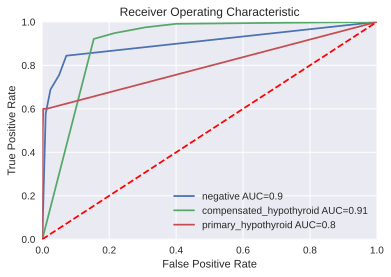

In [ ]:
count_roc_auc(knn, testData, test_label, num_classes, classes_names)

**Conclusion**

* After adjusting the hyperparameters, the results slightly worsened on the roc-auc score.
However, looking at the f1-score, the second class began to be predicted better than at the beginning, the prediction of the zero class became narrower. Class 1 is still in the lead.
* Simple accuracy gives an excellent result-0.92, but you should not believe this estimate 100 percent, so it's worth looking at a balanced accuracy.
* Balanced Accuracy tries to account for the imbalance in the classes and outputs a value of - 0.7, which is very low in comparison with the logistic regression.
* My classifier  identifies the first class very good. The values of the other classes are also close to 1. This fact is also confirmed by the *f1-score* metric. 
* Both other classes are predicted very poorly in the un-tuned KNN model.

# **General conclusion**

* In general, the logistic regression algorithm coped much better with this data set. All metrics in general for all three classes showed excellent results.
* I mainly focused on the "f1-score" metric, since it is something in between recall and precision. It was more convenient to focus on its values.
* The largest 'negative' class was predicted best, although the *SMOTE * algorithm was used to avoid the data imbalance that was present
* Also, speaking about the class that was excluded, there were only two observations in it, it was impossible to correctly predict it, so it was decided to exclude it. However, there was an idea to also use the SMOTE algorithm on it, but then remove two observations from the train, throwing them into the test, but I can't guarantee that there is no duplication of data and the accuracy of the prediction.
* The knn algorithm performed much worse, this can be seen both by the f1-score metric and by the roc-auc.

# **II variant**

At this point in the work, I decided to test a variant of a different data analysis.

* Firstly, since the disease is a delicate matter and consists of many aspects, I removed only completely insignificant features containing 0-1 true/false values. (Previously, I removed features where the spread is slightly larger: from 0 to 59 between true and false).
* Secondly, I decided to get rid of multicollinearity by using deleting two linearly dependent variables.
* Also this time I used the pipeline for convenience.

In [ ]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3709 entries, 0 to 3771
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   age                        3709 non-null   float64
 1   sex                        3709 non-null   object 
 2   on_thyroxine               3709 non-null   object 
 3   query_on_thyroxine         3709 non-null   object 
 4   on_antithyroid_medication  3709 non-null   object 
 5   sick                       3709 non-null   object 
 6   pregnant                   3709 non-null   object 
 7   thyroid_surgery            3709 non-null   object 
 8   I131_treatment             3709 non-null   object 
 9   query_hypothyroid          3709 non-null   object 
 10  query_hyperthyroid         3709 non-null   object 
 11  lithium                    3709 non-null   object 
 12  goitre                     3709 non-null   object 
 13  tumor                      3709 non-null   objec

In [ ]:
new_df.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,referral_source,Class
0,41.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.30,t,2.500000,t,125.0,t,1.140000,t,109.000000,SVHC,1
1,23.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.10,t,2.000000,t,102.0,f,0.994989,f,110.480715,other,1
2,46.0,M,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,2.013504,t,109.0,t,0.910000,t,120.000000,other,1
3,70.0,F,t,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.900000,t,175.0,f,0.994989,f,110.480715,other,1
4,70.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.200000,t,61.0,t,0.870000,t,70.000000,SVI,1


### **Removing minor features**
And get rid of multicollinearity

In [ ]:
new_df.drop(['hypopituitary', 'TBG_measured'],
         axis=1, inplace=True)
new_df.head(3)

In [ ]:
new_df.drop(['TT4', 'FTI'], axis=1, inplace=True)

### **Target encoding**

In [ ]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(new_df[TARGET])
label_encoder.classes_

array([0, 1, 2])

In [ ]:
X_lab = pd.DataFrame(y_encoded,
                 columns=['Class'], index=new_df.index)

In [ ]:
X_lab.head(10)

,Class
0,1
1,1
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1


In [ ]:
new_df.drop('Class', axis=1, inplace=True)

In [ ]:
new_df = new_df.join(X_lab)

new_df.head(5)

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,referral_source,Class
0,41.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.30,t,2.500000,t,125.0,t,1.140000,t,109.000000,SVHC,1
1,23.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.10,t,2.000000,t,102.0,f,0.994989,f,110.480715,other,1
2,46.0,M,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,2.013504,t,109.0,t,0.910000,t,120.000000,other,1
3,70.0,F,t,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.900000,t,175.0,f,0.994989,f,110.480715,other,1
4,70.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.200000,t,61.0,t,0.870000,t,70.000000,SVI,1


### **Split**

In [ ]:
trainData, testData, train_label, test_label = train_test_split(new_df.drop(TARGET, axis=1),
                                                                new_df[TARGET],
                                                                test_size=0.2,
                                                                random_state=42)

print('Size of train set:', trainData.shape)
print('Size of test set:', testData.shape)

print('\nClass distribution on train:',
      train_label.value_counts(normalize=True),
      '\nClass distribution on test:', 
      test_label.value_counts(normalize=True),
      sep='\n')

Size of train set: (2967, 26)
Size of test set: (742, 26)

Class distribution on train:
1    0.924503
0    0.050219
2    0.025278
Name: Class, dtype: float64

Class distribution on test:
1    0.912399
0    0.060647
2    0.026954
Name: Class, dtype: float64


In [ ]:
classes_names = ['negative', 'compensated_hypothyroid', 'primary_hypothyroid']
num_classes = 3

### **Transformation**

In [ ]:
cat = ['referral_source']

numerical = ['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI',]

binary = ['sex', 'on_thyroxine', 'query_on_thyroxine',
       'on_antithyroid_medication', 'sick', 'pregnant', 'thyroid_surgery',
       'I131_treatment', 'query_hypothyroid', 'query_hyperthyroid', 'lithium',
       'goitre', 'tumor', 'psych', 'TSH_measured', 'T3_measured',
       'TT4_measured', 'T4U_measured', 'FTI_measured']

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder 

cat_pipe = Pipeline([
    ('ohe', OneHotEncoder(sparse=False)), 
    ('scaler', StandardScaler())
])

bin_pipe = Pipeline([
    ('ohe', OrdinalEncoder())
    ,('scaler', StandardScaler())
])


log_pipe = Pipeline([
    ('ft', FunctionTransformer(np.log1p))
    ,('scaler', StandardScaler())
])

pipe = ColumnTransformer(transformers=[
    ('cat', cat_pipe, cat),
    ('bin', bin_pipe, binary),
    ('log', log_pipe, numerical)
])

In [ ]:
trainData = pd.DataFrame(pipe.fit_transform(trainData))
testData = pd.DataFrame(pipe.transform(testData))

### **SMOTE**
Improve problem of imbalanced classification dataset

In [ ]:
smote = SMOTE(random_state = 11)
trainData, train_label = smote.fit_resample(trainData, train_label)

print('Resampled dataset shape %s' % Counter(train_label))

Resampled dataset shape Counter({1: 2743, 0: 2743, 2: 2743})


### **Logistic Regression**

Selection of optimal hyperparameters for cross-validation

In [ ]:
params = {
    'logisticregression__C': np.linspace(1e-3,1,100),
    'logisticregression__multi_class': ['ovr'],
    'logisticregression__tol':  np.linspace(1e-4,1,8),
}

In [ ]:
skf = StratifiedKFold(n_splits=5, shuffle=True,random_state=17)
lr = LogisticRegression(random_state=17, class_weight = 'balanced')
scaler = StandardScaler()

lrModel = make_pipeline(
    scaler, 
    lr
)

gd = GridSearchCV(lrModel,
                  params,
                  cv=skf, 
                  scoring='f1_macro', 
                  n_jobs=-1)

In [ ]:
gd.fit(trainData, train_label)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=17, shuffle=True),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('standardscaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('logisticregression',
                                        LogisticRegression(C=1.0,
                                                           class_weight='balanced',
                                                           dual=False,
                                                           fit_intercept=True,
                                                           intercept_scaling=1,
                                                           l1_ratio=None,
                                                           max_ite

In [ ]:
gd.best_params_

{'logisticregression__C': 0.889,
 'logisticregression__multi_class': 'ovr',
 'logisticregression__tol': 0.42862857142857136}

Now we will train the model with the selected parameters

In [ ]:
lgr = LogisticRegression(random_state=17,
                         class_weight = 'balanced',
                         multi_class='ovr',
                         n_jobs=-1, 
                         C= 0.889,
                         tol=0.42862857142857136)

lgr.fit(trainData, train_label)

LogisticRegression(C=0.889, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='ovr', n_jobs=-1, penalty='l2',
                   random_state=17, solver='lbfgs', tol=0.42862857142857136,
                   verbose=0, warm_start=False)

In [ ]:
%%time
pred = lgr.predict(testData)

CPU times: user 1.71 ms, sys: 0 ns, total: 1.71 ms
Wall time: 1.73 ms


**Metrics**

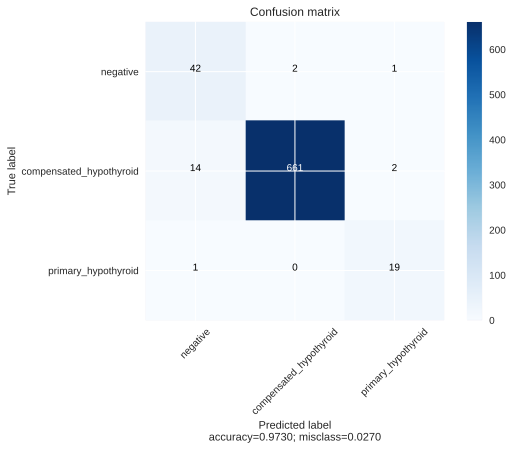

Accuracy: 0.97305 
Balanced accuracy: 0.95323 
Multiclass f1-score: 
    micro: 0.97305 
    macro: 0.90495 
    weighted: 0.97447


Classification report:

              precision    recall  f1-score   support

           0    0.73684   0.93333   0.82353        45
           1    0.99698   0.97637   0.98657       677
           2    0.86364   0.95000   0.90476        20

    accuracy                        0.97305       742
   macro avg    0.86582   0.95323   0.90495       742
weighted avg    0.97761   0.97305   0.97447       742



In [ ]:
calc_metrics(test_label, pred)

**ROC AUC**

ROC AUC: 
    macro: 0.98304 
    weighted: 0.98555


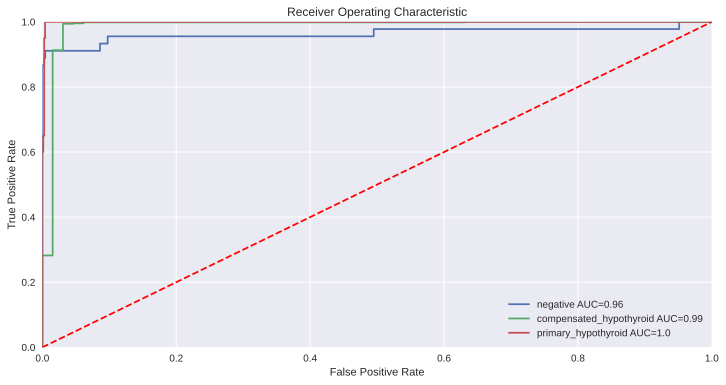

In [ ]:
count_roc_auc(lgr, testData, test_label, num_classes, classes_names)

**Conclusion**

* Simple accuracy gives an excellent result-0.97, but you should not believe this estimate 100 percent, so it's worth looking at a balanced accuracy.
* Balanced Accuracy tries to account for the imbalance in the classes and outputs a value of - 0.95, which is very good.
* My classifier idealy identifies all 3 classes. The values of these classes are also close to 1. This fact is also confirmed by the *f1-score* metric.
* The ROC AUC metric shows an almost perfect result of training a logistic regression model for 3 classes. (1.0 is the highest result)


* This model works better than from the 1st variant.

### **KNN**

In [ ]:
params = {
    'kneighborsclassifier__n_neighbors': [i for i in range(3, 51)], 
    'kneighborsclassifier__weights': ['uniform', 'distance'],
    'kneighborsclassifier__n_jobs': [-1,1,5],
    'kneighborsclassifier__metric': ['euclidean', 'minkowski', 'manhattan'],
    'kneighborsclassifier__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

In [ ]:
kf = KFold(n_splits=5, shuffle=True)
knn = KNeighborsClassifier()
scaler = StandardScaler()

knrModel = make_pipeline(
    scaler, 
    knn
)

gd = GridSearchCV(knrModel,
                  params,
                  cv=kf, 
                  scoring='f1_macro', 
                  n_jobs=-1)

gd.fit(trainData, train_label)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('standardscaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('kneighborsclassifier',
                                        KNeighborsClassifier(algorithm='auto',
                                                             leaf_size=30,
                                                             metric='minkowski',
                                                             metric_params=None,
                                                             n_jobs=None,
                                                             n_neighbors=5, p=2,
                                                       

In [ ]:
gd.best_params_

{'kneighborsclassifier__algorithm': 'auto',
 'kneighborsclassifier__metric': 'manhattan',
 'kneighborsclassifier__n_jobs': -1,
 'kneighborsclassifier__n_neighbors': 4,
 'kneighborsclassifier__weights': 'distance'}


Now we will train the model with the selected parameters:

In [ ]:
knn = KNeighborsClassifier(n_neighbors=4,
                           metric='manhattan', 
                           weights='uniform', 
                           n_jobs=-1,
                           algorithm='auto')

knn.fit(trainData, train_label)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=4, p=2,
                     weights='uniform')

In [ ]:
%%time
pred = knn.predict(testData)

CPU times: user 439 ms, sys: 1.09 ms, total: 440 ms
Wall time: 333 ms


**Quality evaluation**

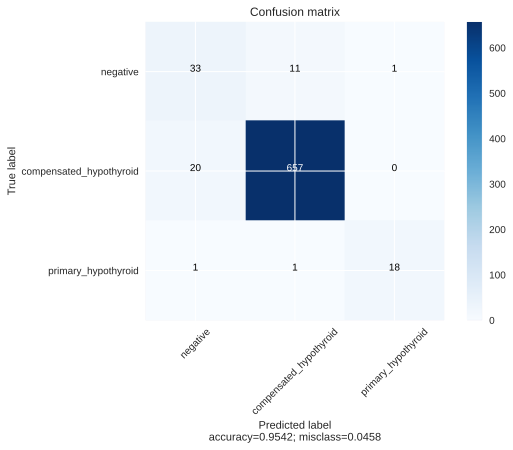

Accuracy: 0.95418 
Balanced accuracy: 0.86793 
Multiclass f1-score: 
    micro: 0.95418 
    macro: 0.85532 
    weighted: 0.95602


Classification report:

              precision    recall  f1-score   support

           0    0.61111   0.73333   0.66667        45
           1    0.98206   0.97046   0.97623       677
           2    0.94737   0.90000   0.92308        20

    accuracy                        0.95418       742
   macro avg    0.84685   0.86793   0.85532       742
weighted avg    0.95863   0.95418   0.95602       742



In [ ]:
calc_metrics(test_label, pred)

**ROC AUC**


ROC AUC: 
    macro: 0.9392 
    weighted: 0.94723


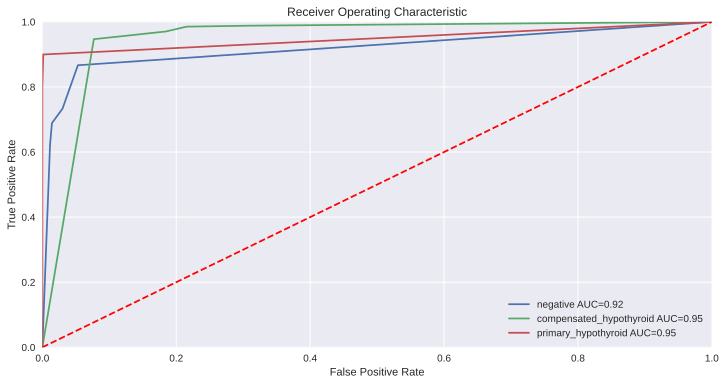

In [ ]:
count_roc_auc(knn, testData, test_label, num_classes, classes_names)

**Conclusion**

**Conclusion**

* Simple accuracy gives an excellent result-0.95, but you should not believe this estimate 100 percent, so it's worth looking at a balanced accuracy.
* Balanced Accuracy tries to account for the imbalance in the classes and outputs a value of - 0.86, which is very good.
* My classifier idealy identifies all 3 classes. The values of these classes are also close to 1. This fact is also confirmed by the *f1-score* metric.
* The ROC AUC metric shows an almost perfect result of training a logistic regression model for 3 classes. 
* This model works better than from the 1st variant of KNN, but it is still predicts worser than logistic regression model.

